# *ASSIGNMENT2*

# 1. Regression and out-of-distribution prediction

In [63]:
#Importing Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy import stats
from sklearn import metrics

## **RED WINE QUALITY**

In [64]:
# Downloading red wine quality file
link='https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv'
RED=pd.read_csv(link,sep=";")

# View Head of RED dataset
RED.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [65]:
# View Tail of RED dataset
RED.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5
1598,6.0,0.310,0.47,3.6,0.067,18.0,42.0,0.99549,3.39,0.66,11.0,6


In [66]:
# Check for NULL Entries
RED.notnull().all()

fixed acidity           True
volatile acidity        True
citric acid             True
residual sugar          True
chlorides               True
free sulfur dioxide     True
total sulfur dioxide    True
density                 True
pH                      True
sulphates               True
alcohol                 True
quality                 True
dtype: bool

Hence there is no null entry.

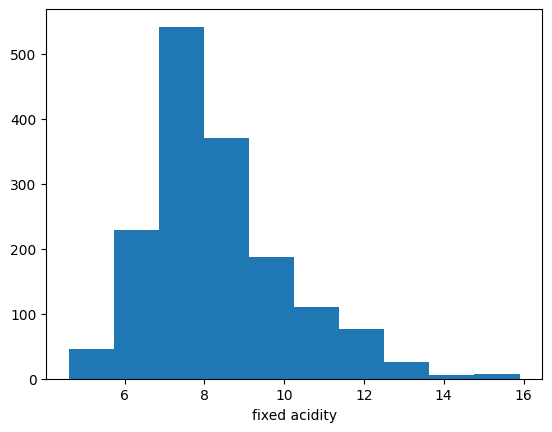

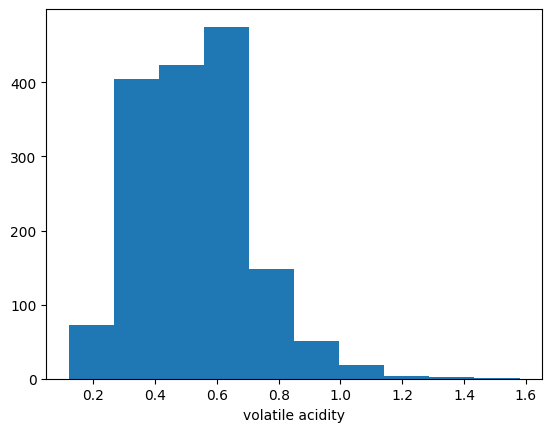

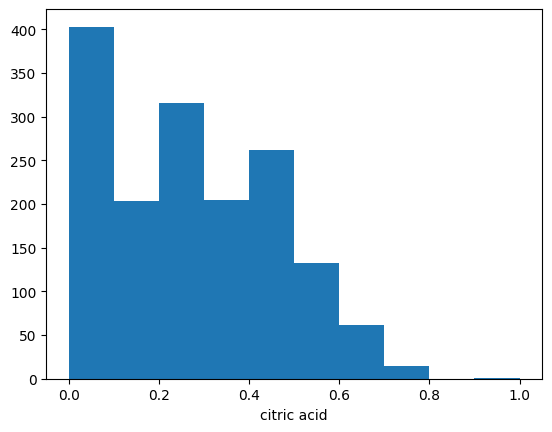

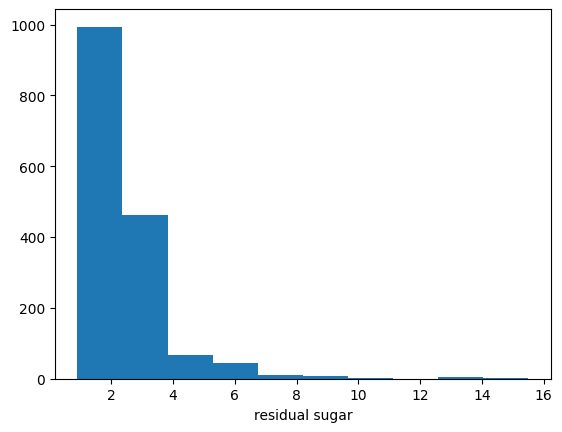

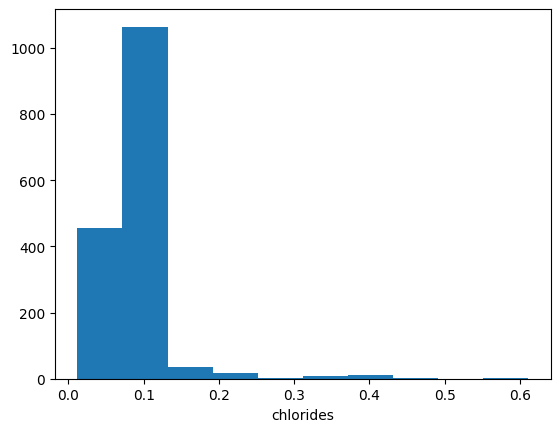

...

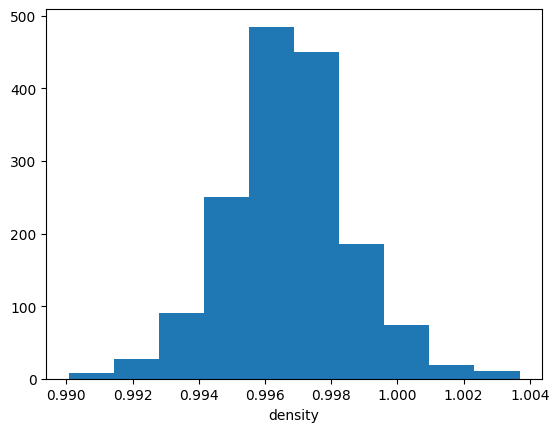

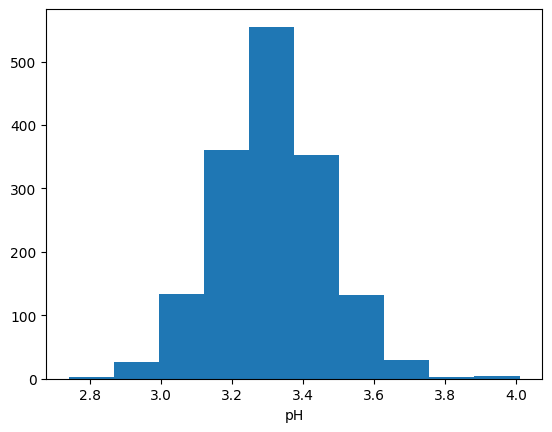

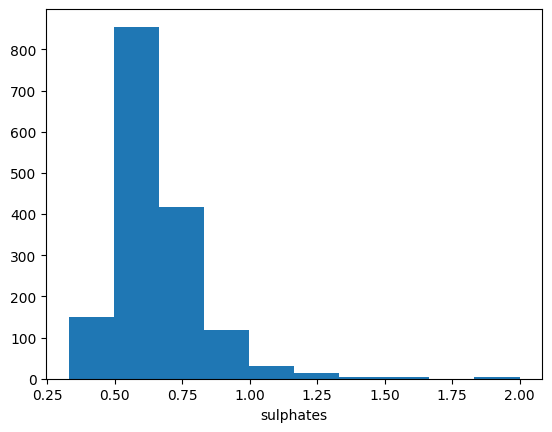

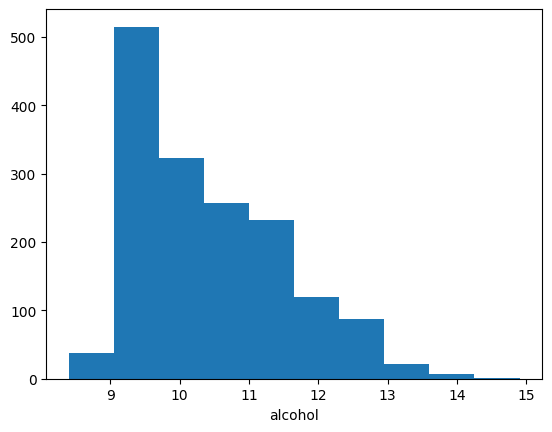

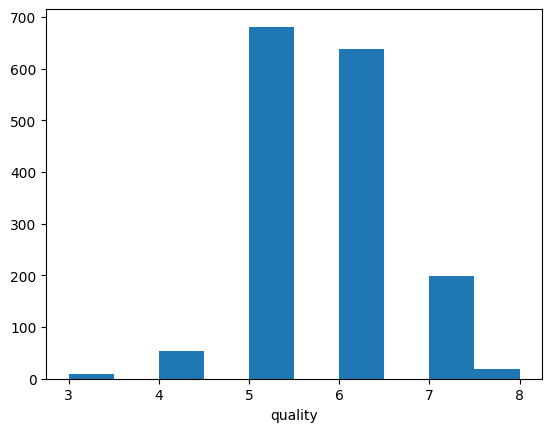

In [67]:
# Plot Histogram
for i in RED.columns.values:
  plt.hist(RED[i])
  plt.xlabel(i)
  plt.show()

Except for quality, all the variables are continuous.

array([[<AxesSubplot:xlabel='fixed acidity', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='volatile acidity', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='citric acid', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='residual sugar', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='chlorides', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='free sulfur dioxide', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='total sulfur dioxide', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='density', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='pH', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='sulphates', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='alcohol', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='quality', ylabel='fixed acidity'>],
       [<AxesSubplot:xlabel='fixed acidity', ylabel='volatile acidity'>,
        <AxesSubplot:xlabel='volatile acidity', ylabel='volatile acidity'>,
        <AxesSubplot:xlabel='cit

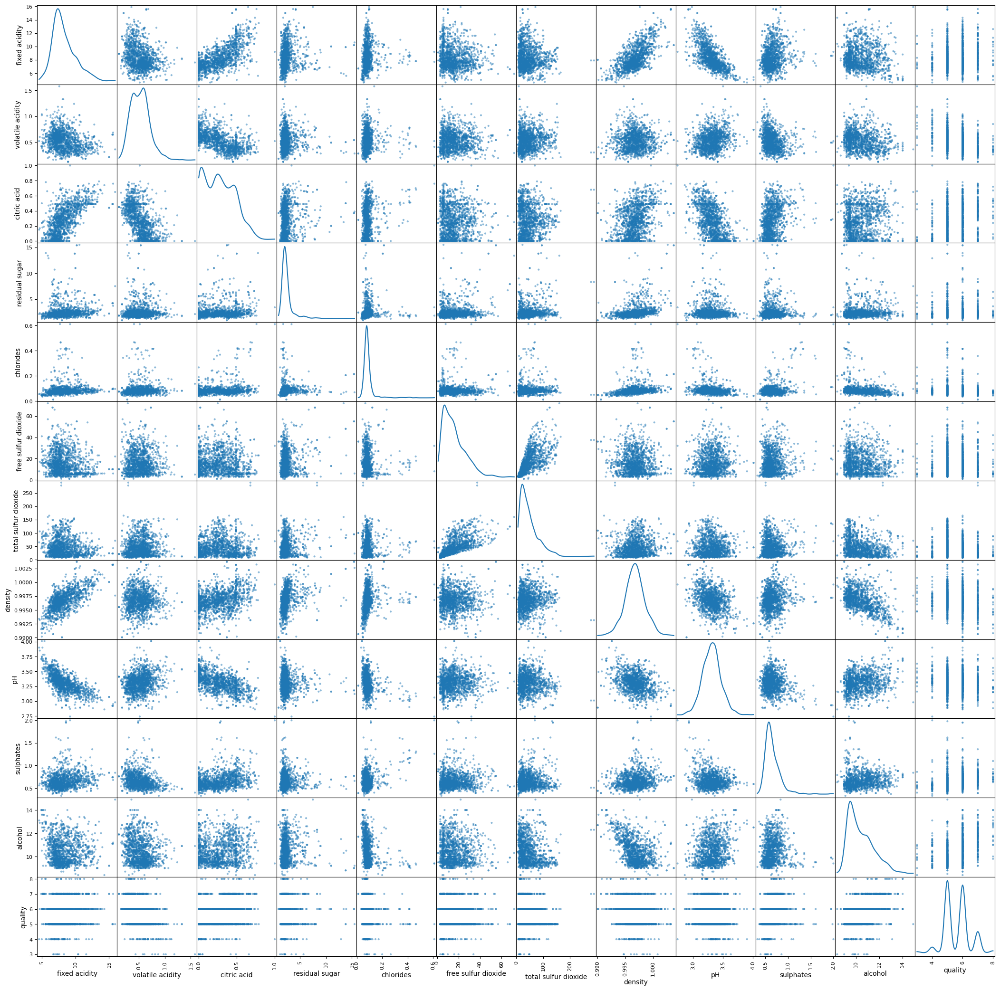

In [68]:
# Plot Pair Wise Scatter Matrix(DATA VISUALISATION)
pd.plotting.scatter_matrix(RED,alpha=0.5,figsize=(26,26),diagonal="kde") 

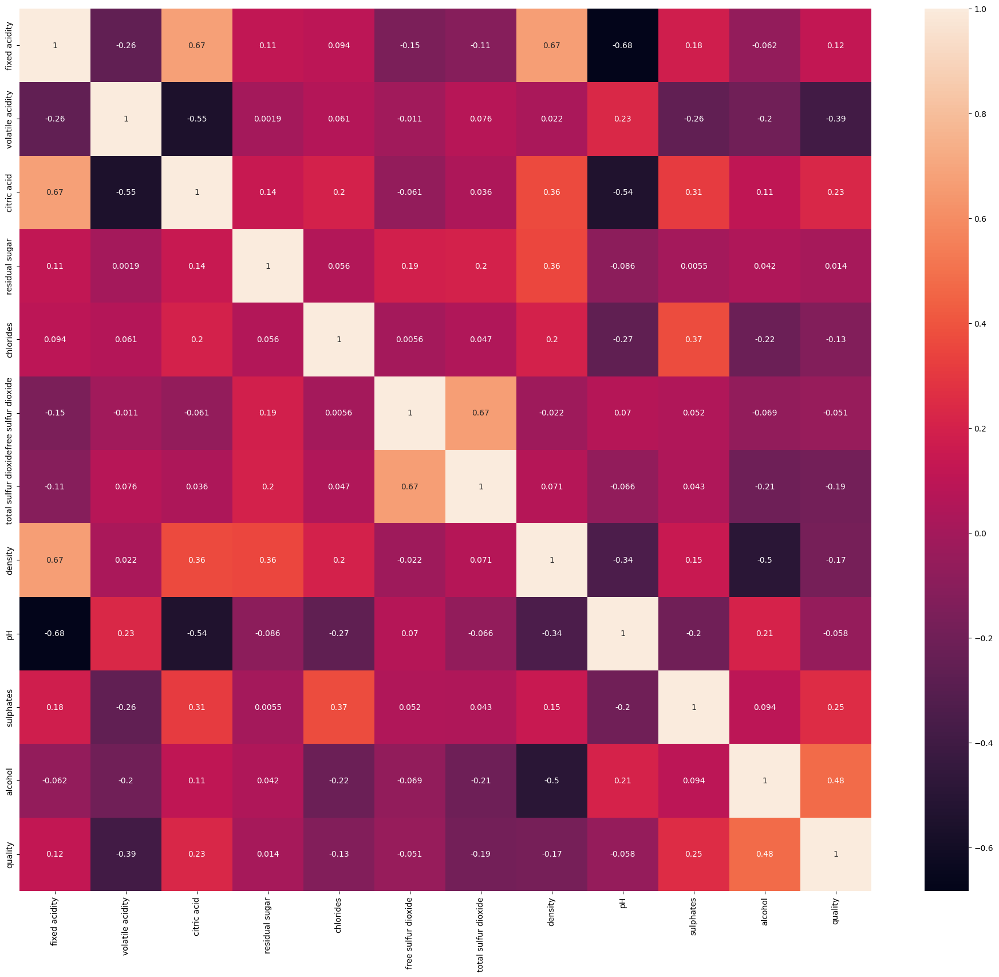

In [69]:
# Check Correlation using HeatMap 
fig, az =plt.subplots(figsize=(24,20))
sns.heatmap(RED.corr(),annot=True)
plt.show()

Here, values in cell represents correlation values.

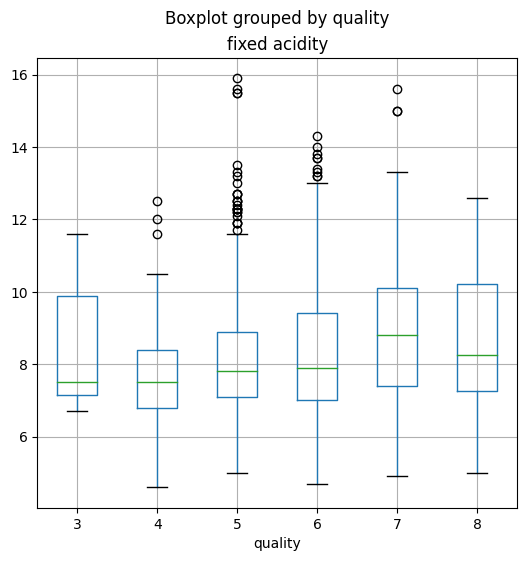

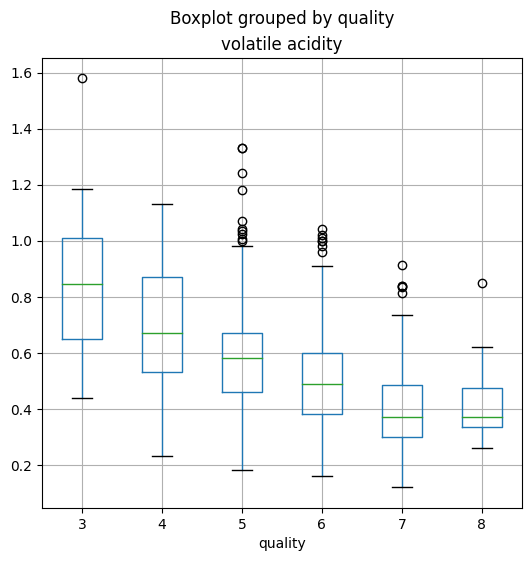

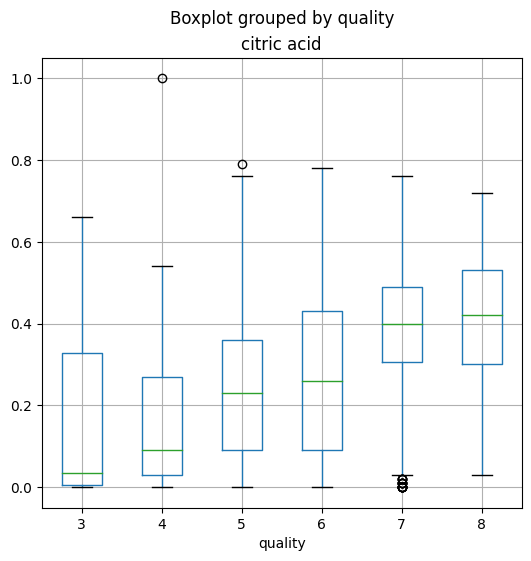

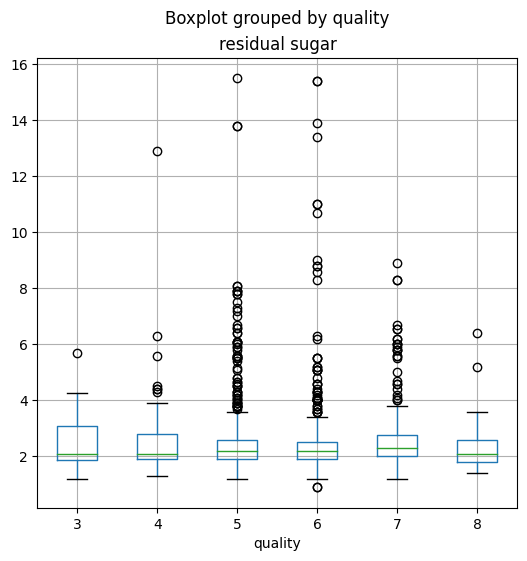

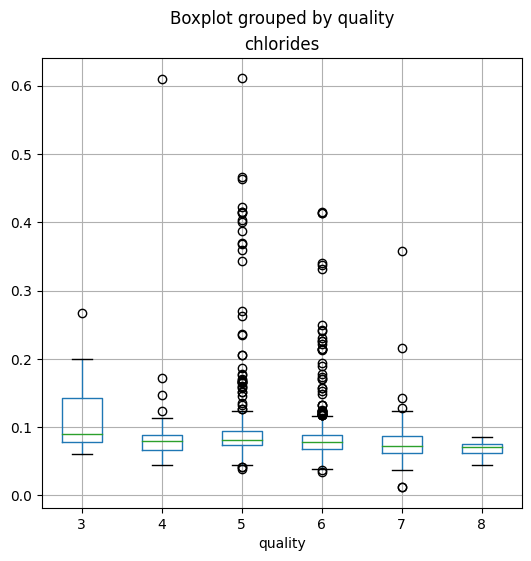

...

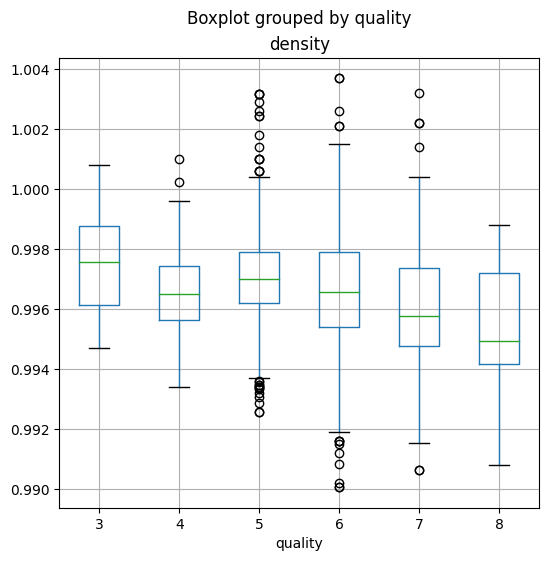

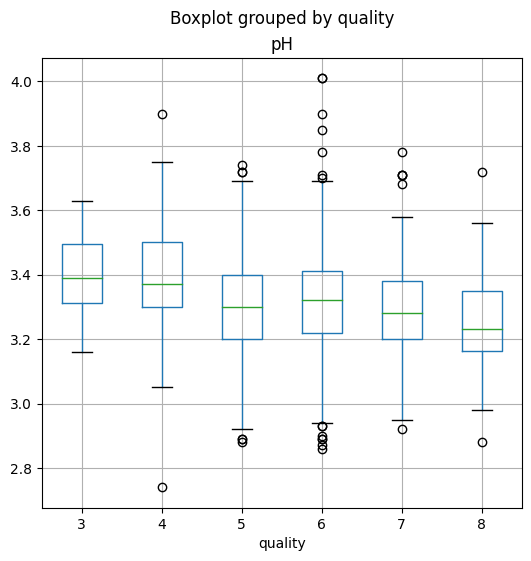

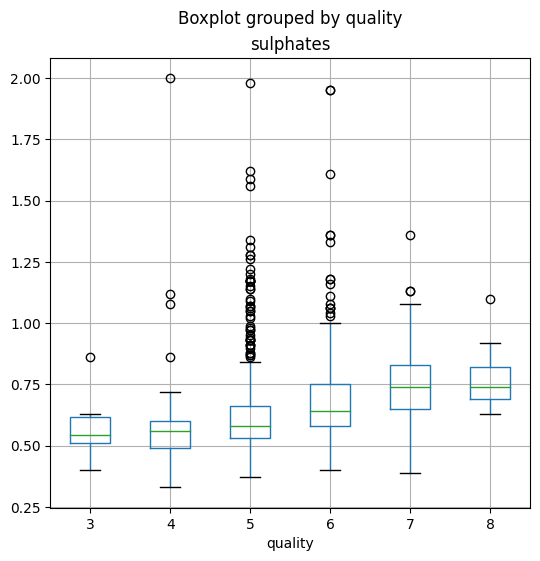

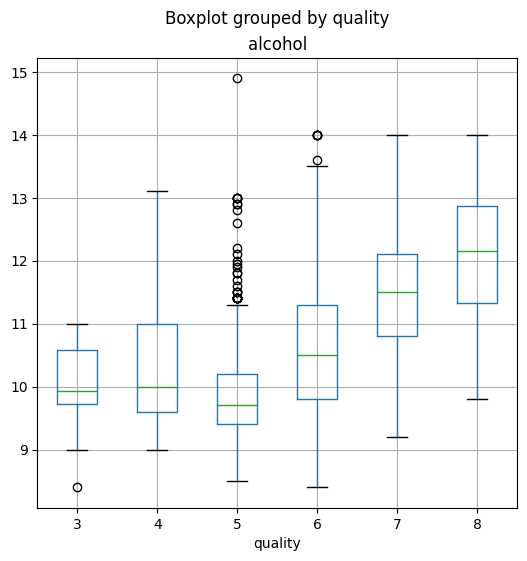

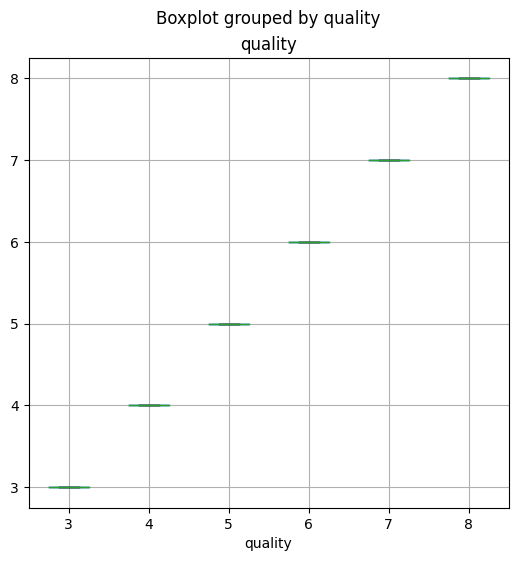

In [70]:
# Box Plot to check for Outliers
for i in RED.columns.values:
  RED.boxplot(column=i,by='quality',grid=True,figsize=(6,6))

All the points outside box plot are outliers.

Now, we need to remove this correlated and outlier points to reduce complexity and improve the model.

In [71]:
# Create correlation matrix
corr_matrix = RED.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop features
RED.drop(to_drop, axis=1, inplace=True)

# code from https://stackoverflow.com/a/52509954, with only necessary naming and value changes

##### Splitting Dataset into TRAIN, VALIDATION AND TEST

In [72]:
# Splitting Target Value(Quality) and Features X--> Input features to Model Y--> Wine Quality Score
X=RED.drop(["quality"],axis=1)
Y=RED["quality"]

In [73]:
# Splitting dataset into 60-20-20 ratio
from sklearn.model_selection import train_test_split
x, x_test, y, y_test = train_test_split(X,Y,test_size=0.2,train_size=0.8)
x_train, x_val, y_train, y_val = train_test_split(x,y,test_size = 0.25,train_size =0.75)

#### Preprocessing

In [74]:
# Scale the features to have zero mean and unit variance
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_val_scaled = scaler.transform(x_val)
x_test_scaled = scaler.transform(x_test)

### **RandomForest**

In [75]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from tabulate import tabulate

# Hyperparameters which will be varied discretely
max_depth_values = np.linspace(10,60,5)
n_estimators_values = [50,100,200,300,400,500]

# Initialize variables 
results = []

# Loop over each combination of hyperparameters
for max_depth in max_depth_values:
    for n_estimators in n_estimators_values:
        # Initialize the Random Forest model with current hyperparameters
        rf_model = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=1)

        # Train the model on the training data
        rf_model.fit(x_train_scaled, y_train)

        # Validate the model on the validation data
        y_val_pred = rf_model.predict(x_val_scaled)

        # Calculate R-squared
        r_squared = r2_score(y_val, y_val_pred)

        # Store results
        results.append([r_squared, max_depth, n_estimators])

# Print the results as a table
print(tabulate(results, headers=['R-squared', 'Max Depth', 'N Estimators'], tablefmt='pretty'))

+---------------------+-----------+--------------+
|      R-squared      | Max Depth | N Estimators |
+---------------------+-----------+--------------+
| 0.46883042456411783 |   10.0    |      50      |
| 0.4836536491470874  |   10.0    |     100      |
| 0.4843754277619179  |   10.0    |     200      |
| 0.48790159306874425 |   10.0    |     300      |
| 0.48938735879867834 |   10.0    |     400      |
| 0.48876934001267014 |   10.0    |     500      |
| 0.48291379537640133 |   22.5    |      50      |
| 0.49686642145459026 |   22.5    |     100      |
| 0.49894964722019575 |   22.5    |     200      |
| 0.5060832797284054  |   22.5    |     300      |
| 0.5058600877675905  |   22.5    |     400      |
| 0.5060808719884549  |   22.5    |     500      |
| 0.4831868412743755  |   35.0    |      50      |
| 0.49694504668400696 |   35.0    |     100      |
| 0.49890430154410537 |   35.0    |     200      |
| 0.5060458169826544  |   35.0    |     300      |
| 0.5059089473921605  |   35.0 

In [76]:
# Finding the hyperparamters which give best model (higher R2 score => Better model)
best_r_squared = -float('inf')
best_max_depth = None
best_n_estimators = None

# Loop through the results to find the best R-squared and its corresponding hyperparameters
for r_squared, max_depth, n_estimators in results:
    if r_squared > best_r_squared:
        best_r_squared = r_squared
        best_max_depth = max_depth
        best_n_estimators = n_estimators
      
# Train the final model with the best hyperparameters on the entire training set
final_rf_model = RandomForestRegressor(n_estimators=best_n_estimators, max_depth=best_max_depth, random_state=42)
final_rf_model.fit(x_train_scaled, y_train)

# Test the final model on the test data
y_test_pred = final_rf_model.predict(x_test_scaled)

# Calculate test R-squared
test_r_squared_rf = r2_score(y_test, y_test_pred)
print(f"Test R-squared: {test_r_squared_rf}")

Test R-squared: 0.441687085600753


##### Feature Importance

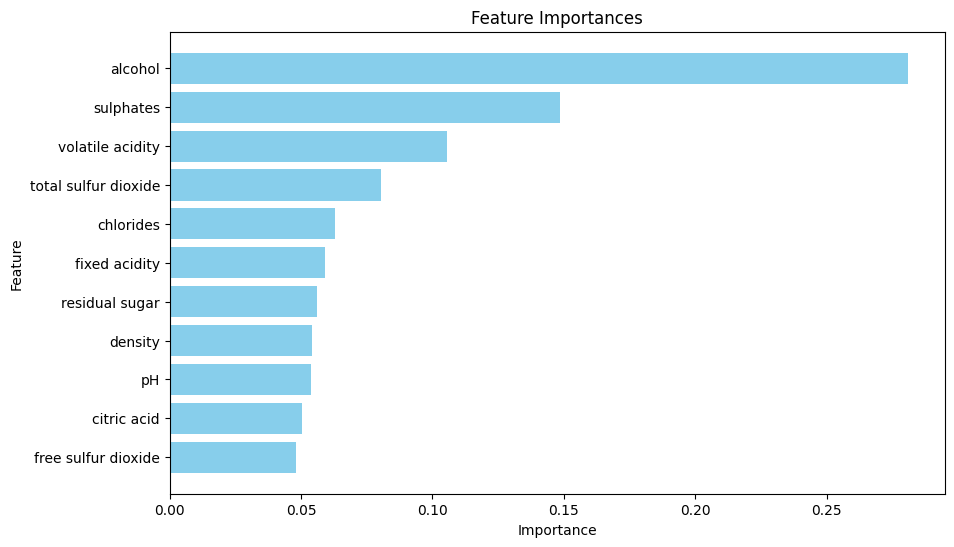

In [77]:
# Get feature importances from the final model
feature_importances = final_rf_model.feature_importances_

# Create a DataFrame to store feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis()  # Invert y-axis to show most important features at the top
plt.show()

#Above code is taken from ChatGPT

We can thus see that **alcohol** is the most important feature for this model.

### **Support vector regression with RBF kernel**

In [78]:
from sklearn.svm import SVR

# Range of hyperparameters to try
param_C= [0.01,0.1, 1, 10, 100]  # Varying the C parameter
param_gamma= ['scale', 'auto'] # Varying gamma parameter

# Initialize variables 
results = []

# Iterate over each combination of hyperparameters
for C in param_C:
    for gamma in param_gamma:
        # Train the SVR model with RBF kernel
        svr_model = SVR(kernel='rbf', C=C, gamma=gamma)
        svr_model.fit(x_train_scaled, y_train)
        
        # Validate the SVR model on the validation data
        y_val_pred = svr_model.predict(x_val_scaled)
        
        # Calculate R-squared
        r_squared = r2_score(y_val, y_val_pred)

        # Store results
        results.append([r_squared, C, gamma])

# Print the results as a table
print(tabulate(results, headers=['R-squared', 'C', 'GAMMA'], tablefmt='pretty'))

+---------------------+------+-------+
|      R-squared      |  C   | GAMMA |
+---------------------+------+-------+
| 0.24486994124298822 | 0.01 | scale |
| 0.24486994124298822 | 0.01 | auto  |
| 0.35238347992097985 | 0.1  | scale |
| 0.35238347992097985 | 0.1  | auto  |
| 0.38708257922077427 |  1   | scale |
| 0.38708257922077427 |  1   | auto  |
| 0.38624964227691083 |  10  | scale |
| 0.38624964227691083 |  10  | auto  |
| 0.1706605373244764  | 100  | scale |
| 0.1706605373244764  | 100  | auto  |
+---------------------+------+-------+


In [79]:
# Finding the hyperparamters which give best model (higher R2 score => Better model)
best_r_squared = -float('inf')
best_C = None
best_gamma = None

# Loop through the results to find the best R-squared and its corresponding hyperparameters
for r_squared, C, gamma in results:
    if r_squared > best_r_squared:
        best_r_squared = r_squared
        best_C = C
        best_gamma = gamma

# Train the final model with the best hyperparameters on the entire training set
final_svr_model = SVR(kernel='rbf', C=best_C, gamma=best_gamma)
final_svr_model.fit(x_train_scaled, y_train)

# Test the final model on the test data
y_test_pred = final_svr_model.predict(x_test_scaled)

# Calculate test R-squared
test_r_squared_svr = r2_score(y_test, y_test_pred)
print(f"Test R-squared: {test_r_squared_svr}")

Test R-squared: 0.3501764789107925


#### Feature Importance

To determine the importance of each variable in the SVR models, we can't directly use feature importances as we do in tree-based models like Random Forest. However, we can assess the importance indirectly by using permutation importance. Permutation importance evaluates the importance of each feature by measuring how much a model's performance decreases when the values of that feature are randomly shuffled. Features causing larger performance drops are considered more important, providing insights into which features are most influential for the model's predictions.

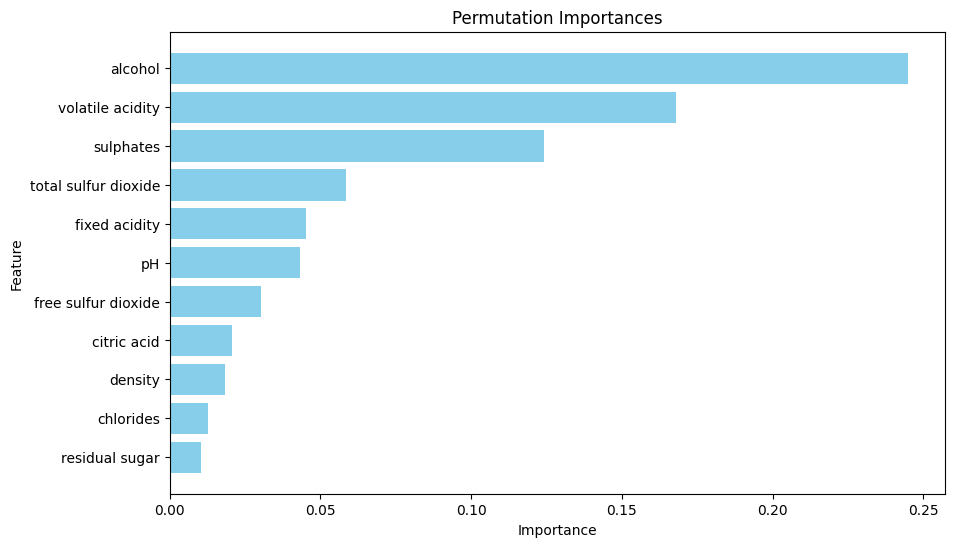

In [80]:
from sklearn.inspection import permutation_importance
# Calculate permutation importances
perm_importance = permutation_importance(final_svr_model, x_test_scaled, y_test, n_repeats=30, random_state=42)

# Get feature names
feature_names = X.columns

# Plot permutation importances
sorted_idx = perm_importance.importances_mean.argsort()
plt.figure(figsize=(10, 6))
plt.barh(feature_names[sorted_idx], perm_importance.importances_mean[sorted_idx], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Permutation Importances')
plt.show()

Thus we can see that **alcohol** is the most important feature for this model.

In [81]:
results = pd.DataFrame({
    'Model': ['Random Forest','SVR With RBF Kernel'],
    'Score': [test_r_squared_rf, test_r_squared_svr]})

result_df = results.sort_values(by='Score', ascending=False)
result_df = result_df.set_index('Score')
result_df

,Model
Score,
0.441687,Random Forest
0.350176,SVR With RBF Kernel


## **WHITE WINE QUALITY**

In [82]:
# Downloading white wine quality file
link='https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-white.csv'
WHITE=pd.read_csv(link,sep=";")

# View Head of WHITE dataset
WHITE.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [83]:
# View Tail of WHITE dataset
WHITE.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7
4897,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6


In [85]:
# Check for NULL Entries
WHITE.notnull().all()

fixed acidity           True
volatile acidity        True
citric acid             True
residual sugar          True
chlorides               True
free sulfur dioxide     True
total sulfur dioxide    True
density                 True
pH                      True
sulphates               True
alcohol                 True
quality                 True
dtype: bool

Hence, there is no null entry.

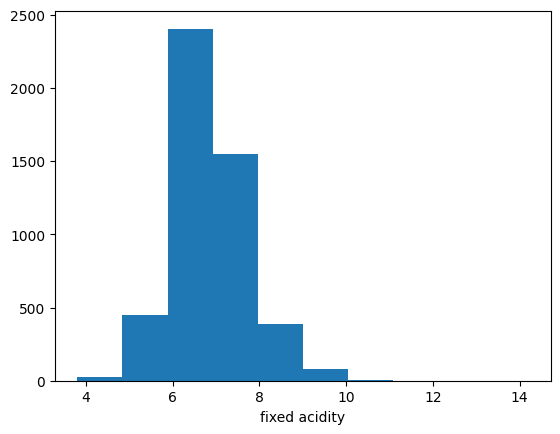

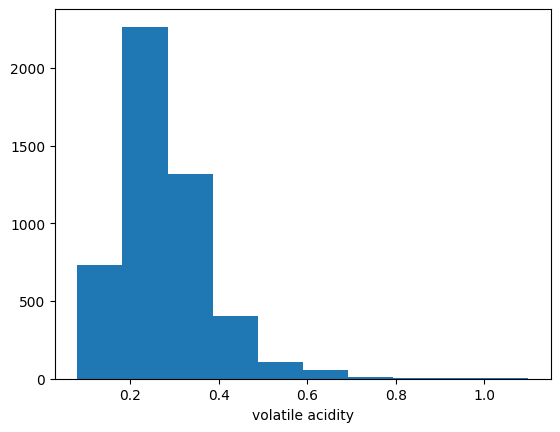

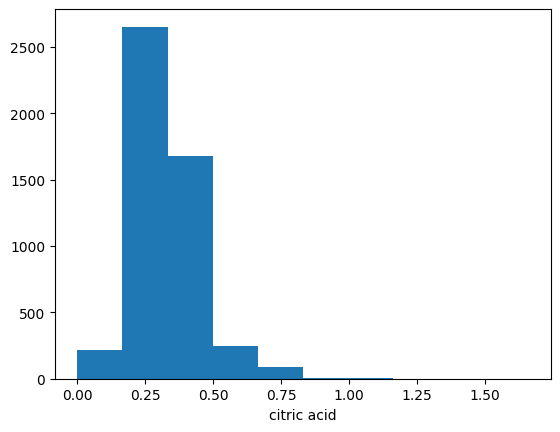

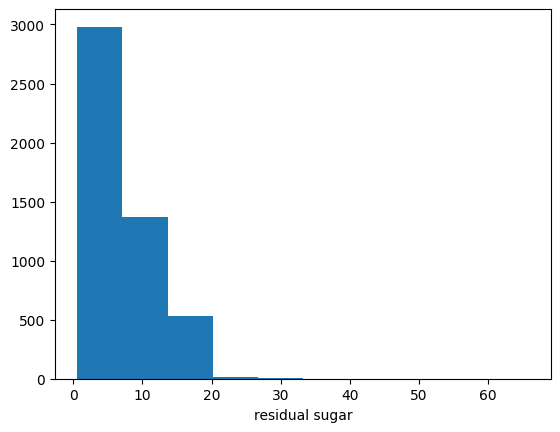

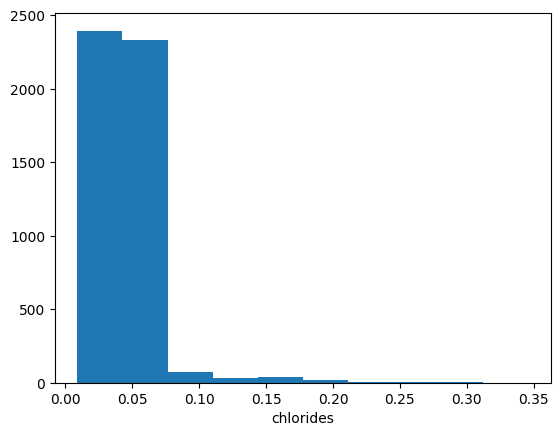

...

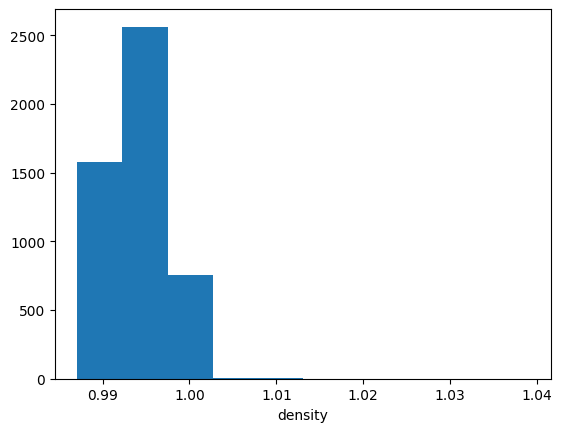

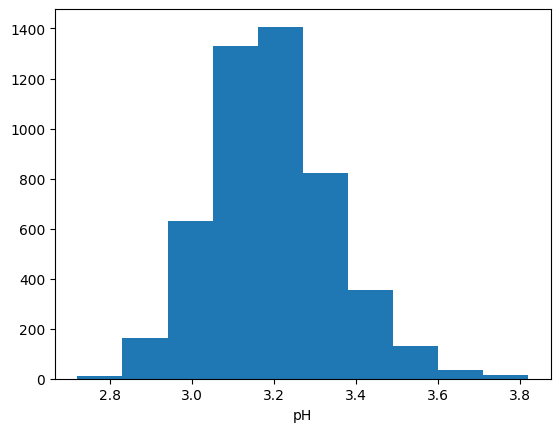

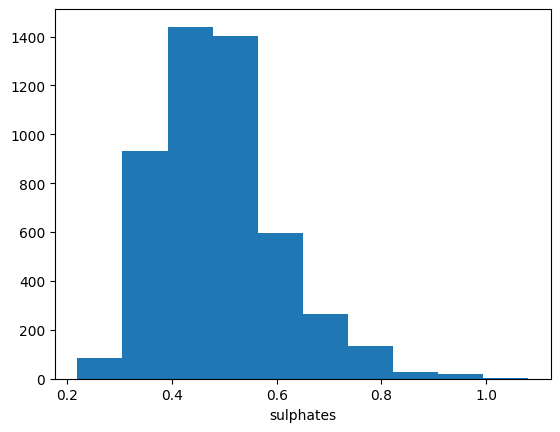

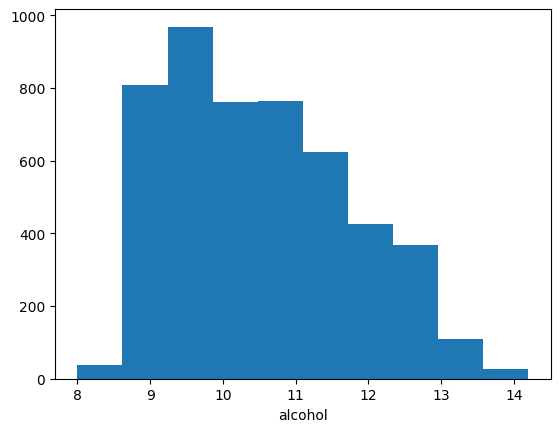

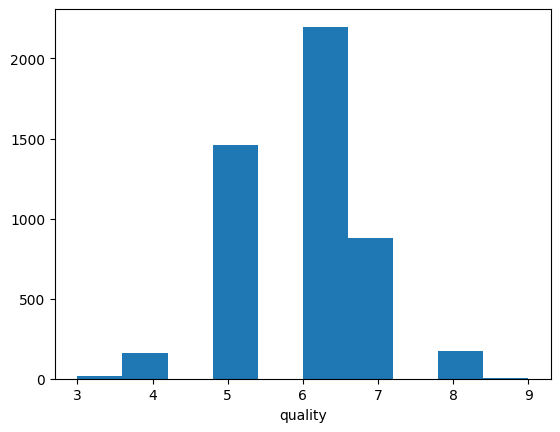

In [86]:
# Plot Histogram
for i in WHITE.columns.values:
  plt.hist(WHITE[i])
  plt.xlabel(i)
  plt.show()

Except for quality, all are continuous variables.

array([[<AxesSubplot:xlabel='fixed acidity', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='volatile acidity', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='citric acid', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='residual sugar', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='chlorides', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='free sulfur dioxide', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='total sulfur dioxide', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='density', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='pH', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='sulphates', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='alcohol', ylabel='fixed acidity'>,
        <AxesSubplot:xlabel='quality', ylabel='fixed acidity'>],
       [<AxesSubplot:xlabel='fixed acidity', ylabel='volatile acidity'>,
        <AxesSubplot:xlabel='volatile acidity', ylabel='volatile acidity'>,
        <AxesSubplot:xlabel='cit

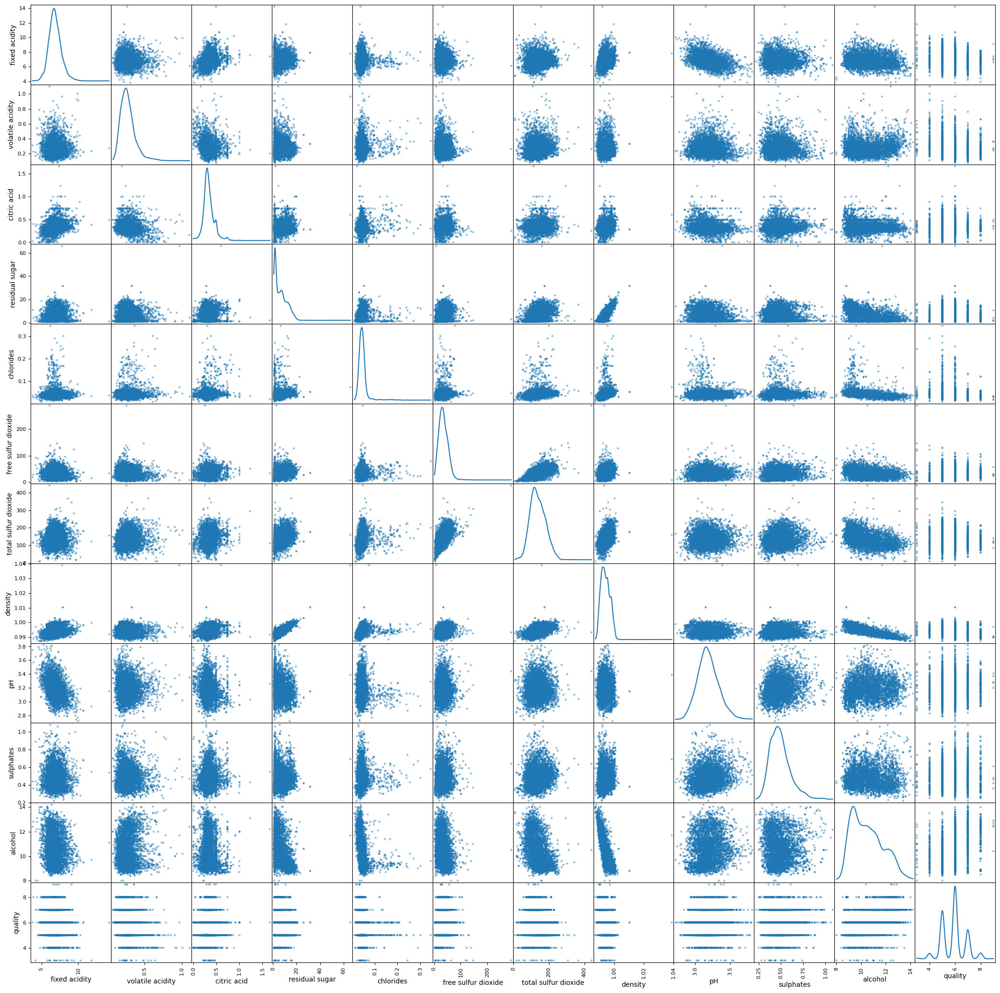

In [87]:
# Plot Pair Wise Scatter Matrix(DATA VISUALISATION)
pd.plotting.scatter_matrix(WHITE,alpha=0.5,figsize=(26,26),diagonal="kde") 

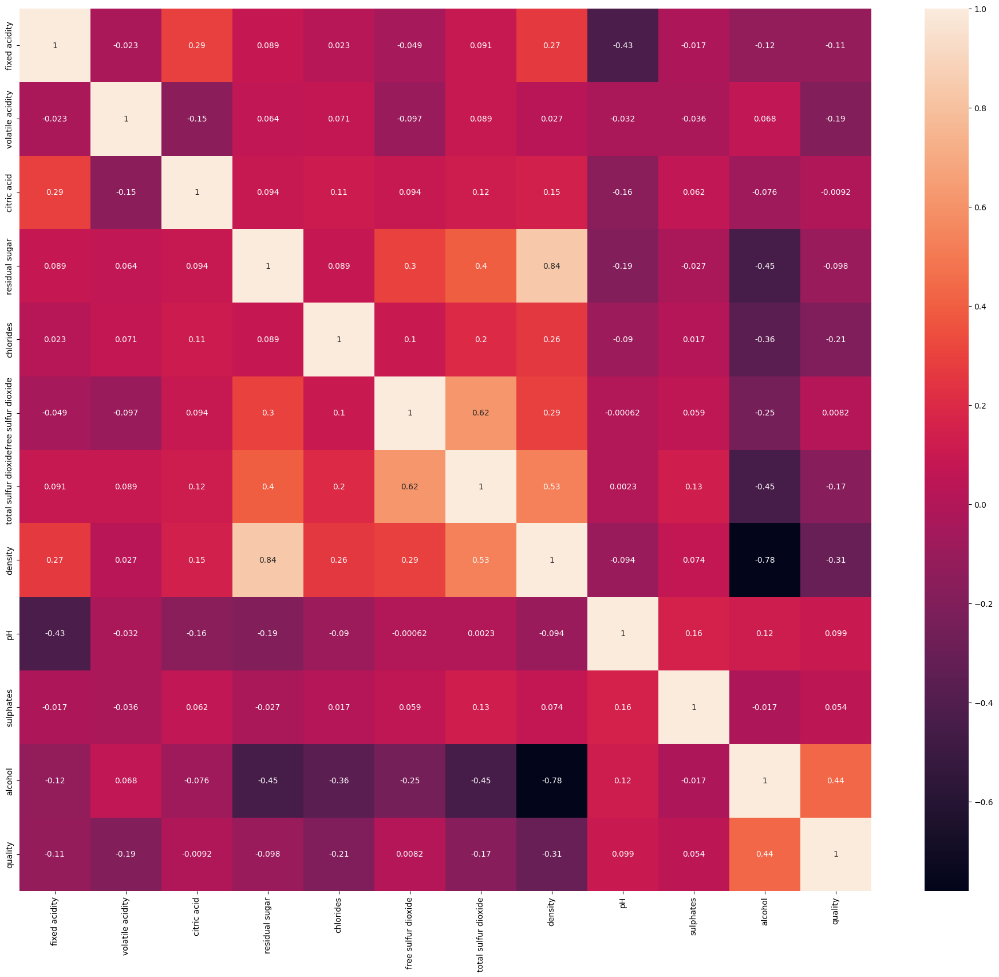

In [88]:
# Check Correlation using HeatMap 
fig, az =plt.subplots(figsize=(24,20))
sns.heatmap(WHITE.corr(),annot=True)
plt.show()

Here, values in cell represent correlation strength.

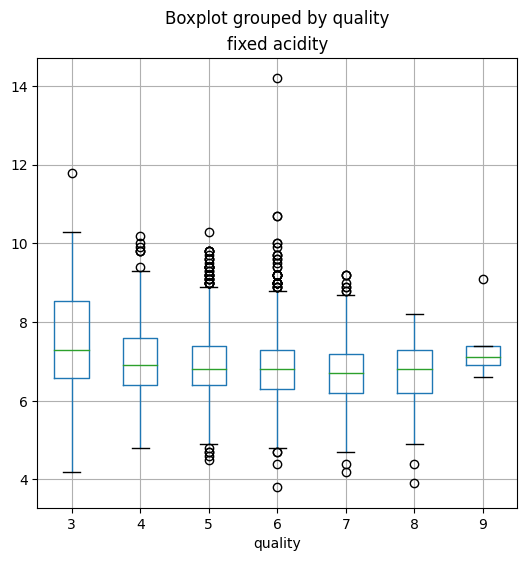

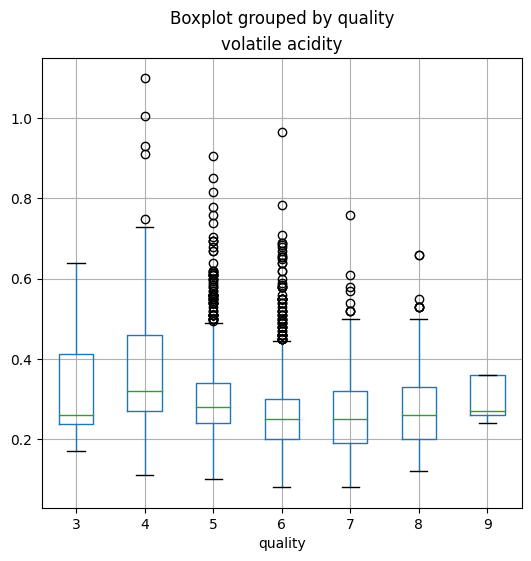

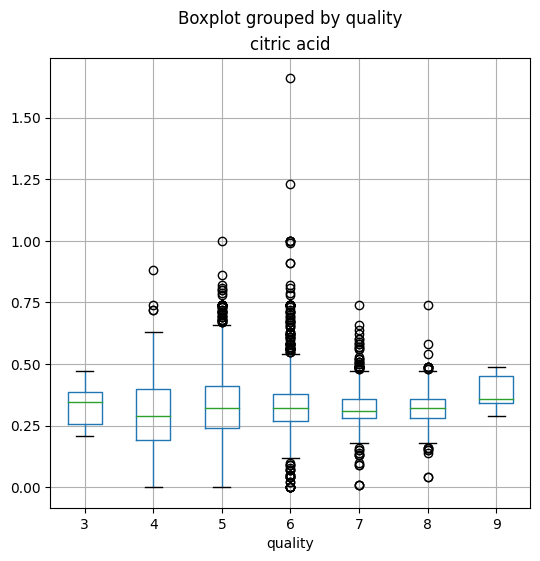

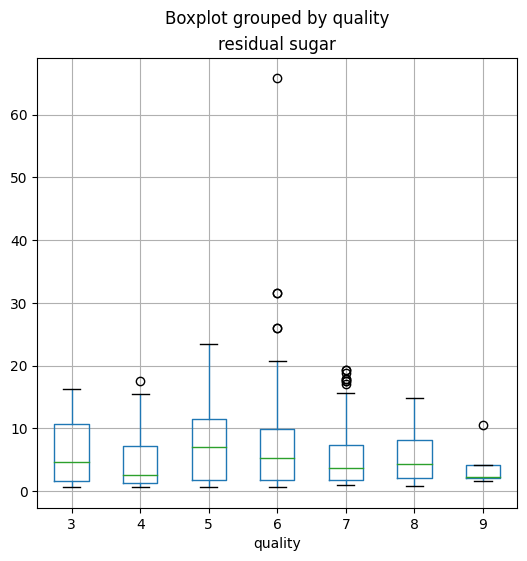

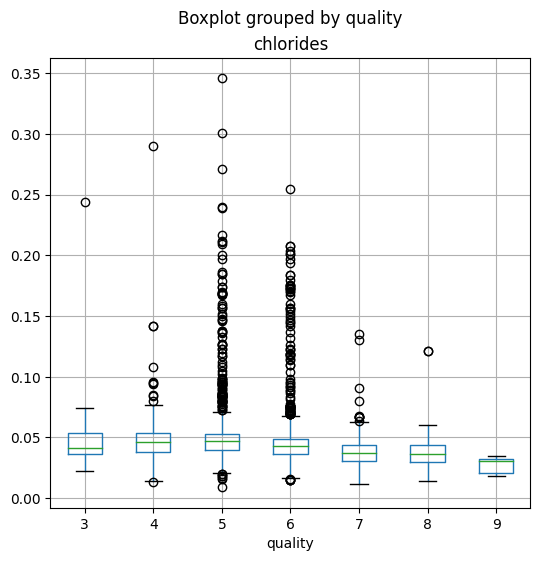

...

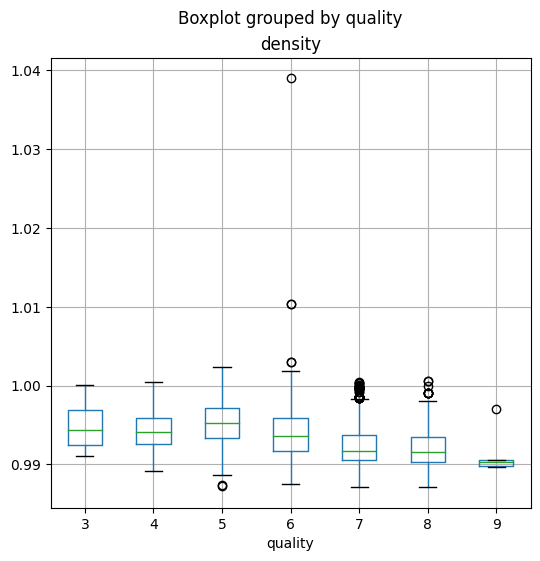

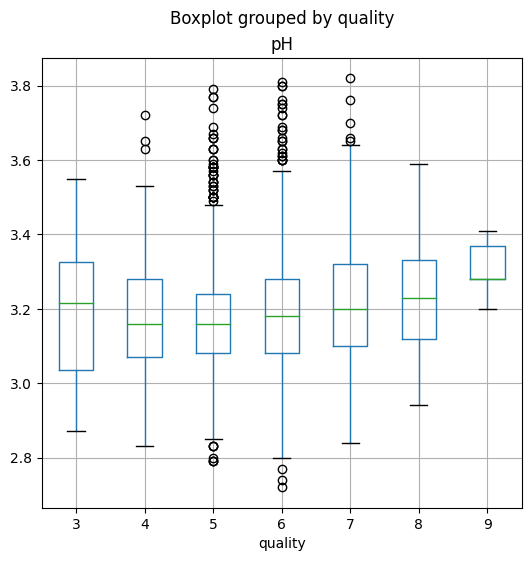

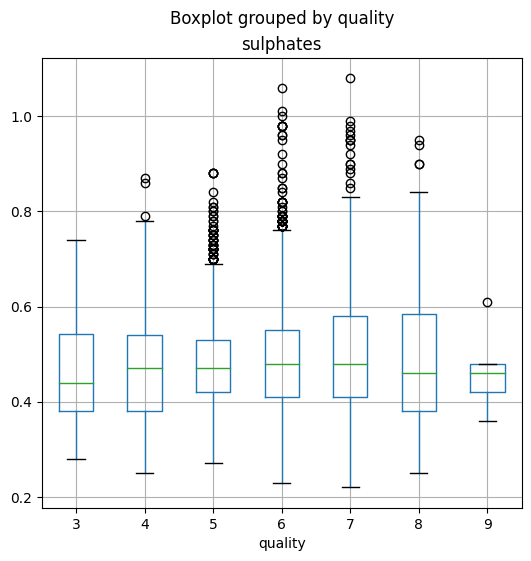

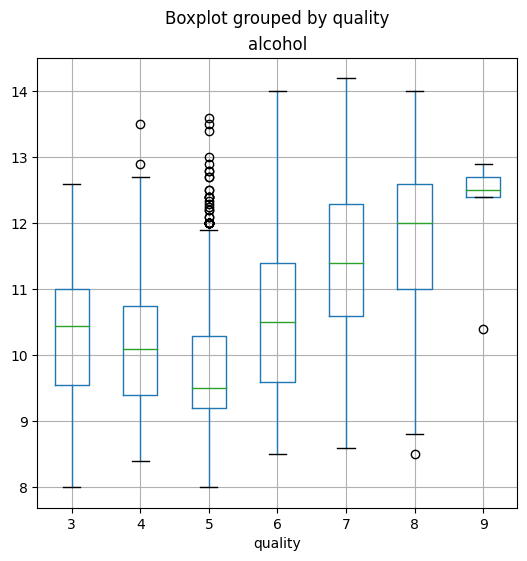

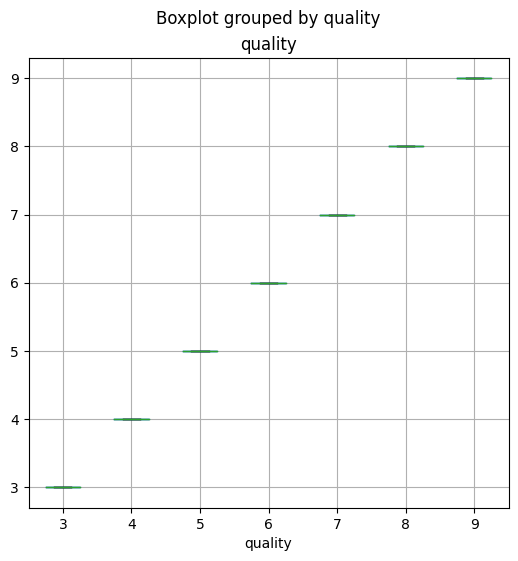

In [89]:
# Box Plot to check for Outliers
for i in WHITE.columns.values:
  WHITE.boxplot(column=i,by='quality',grid=True,figsize=(6,6))

Points outside box plot are outliers.

In [91]:
# Create correlation matrix
corr_matrix = WHITE.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop features
WHITE.drop(to_drop, axis=1, inplace=True)

# code from https://stackoverflow.com/a/52509954, with only necessary naming and value changes

##### Splitting Dataset into TRAIN, VALIDATION AND TEST

In [92]:
# Splitting Target Value(Quality) and Features X--> Input features to Model Y--> Wine Quality Score
X=WHITE.drop(["quality"],axis=1)
Y=WHITE["quality"]

In [93]:
# Splitting dataset into 60-20-20 ratio
from sklearn.model_selection import train_test_split
x, x_test2, y, y_test2 = train_test_split(X,Y,test_size=0.2,train_size=0.8)
x_train, x_val, y_train, y_val = train_test_split(x,y,test_size = 0.25,train_size =0.75)

#### Preprocessing

In [94]:
# Scale the features to have zero mean and unit variance
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_val_scaled = scaler.transform(x_val)
x_test_scaled2 = scaler.transform(x_test2)

### **RandomForest**

In [95]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from tabulate import tabulate

# Hyperparameters which will be varied discretely
max_depth_values = np.linspace(10,60,5)
n_estimators_values = [50,100,200,300,400,500]

# Initialize variables 
results = []

# Loop over each combination of hyperparameters
for max_depth in max_depth_values:
    for n_estimators in n_estimators_values:
        # Initialize the Random Forest model with current hyperparameters
        rf_model = RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, random_state=10)

        # Train the model on the training data
        rf_model.fit(x_train_scaled, y_train)

        # Validate the model on the validation data
        y_val_pred = rf_model.predict(x_val_scaled)

        # Calculate R-squared
        r_squared = r2_score(y_val, y_val_pred)

        # Store results
        results.append([r_squared, max_depth, n_estimators])

# Print the results as a table
print(tabulate(results, headers=['R-squared', 'Max Depth', 'N Estimators'], tablefmt='pretty'))

+---------------------+-----------+--------------+
|      R-squared      | Max Depth | N Estimators |
+---------------------+-----------+--------------+
| 0.3966468500163295  |   10.0    |      50      |
| 0.4006877533351405  |   10.0    |     100      |
| 0.40330975236818745 |   10.0    |     200      |
| 0.4039343808782603  |   10.0    |     300      |
| 0.40299894445240714 |   10.0    |     400      |
| 0.40393492340343784 |   10.0    |     500      |
| 0.42476633518120877 |   22.5    |      50      |
| 0.4316268305210237  |   22.5    |     100      |
| 0.4396434288058839  |   22.5    |     200      |
| 0.44201789556828863 |   22.5    |     300      |
| 0.4433305125622252  |   22.5    |     400      |
|  0.445004693627312  |   22.5    |     500      |
| 0.42524402463025657 |   35.0    |      50      |
| 0.4318431983231381  |   35.0    |     100      |
| 0.43965110279804775 |   35.0    |     200      |
| 0.44248888595521874 |   35.0    |     300      |
| 0.4433637980760812  |   35.0 

In [96]:
# Finding the hyperparamters which give best model (higher R2 score => Better model)
best_r_squared2 = -float('inf')
best_max_depth2 = None
best_n_estimators2 = None

# Loop through the results to find the best R-squared and its corresponding hyperparameters
for r_squared, max_depth, n_estimators in results:
    if r_squared > best_r_squared2:
        best_r_squared2 = r_squared
        best_max_depth2 = max_depth
        best_n_estimators2 = n_estimators
       
# Train the final model with the best hyperparameters on the entire training set
final_rf_model2 = RandomForestRegressor(n_estimators=best_n_estimators2, max_depth=best_max_depth2, random_state=42)
final_rf_model2.fit(x_train_scaled, y_train)

# Test the final model on the test data
y_test_pred = final_rf_model2.predict(x_test_scaled2)

# Calculate test R-squared
test_r_squared_rf = r2_score(y_test2, y_test_pred)
print(f"Test R-squared: {test_r_squared_rf}")

Test R-squared: 0.5012997922435457


##### Feature Importance

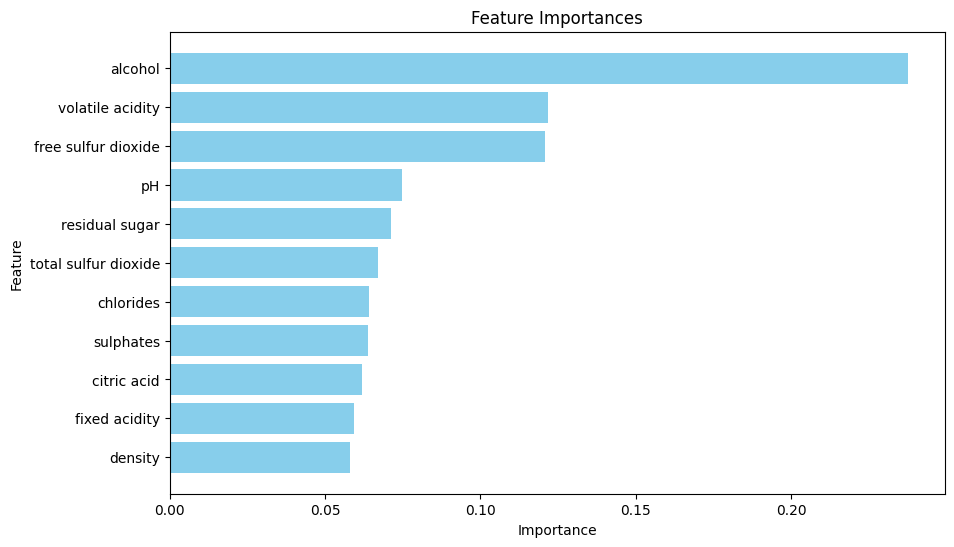

In [97]:
# Get feature importances from the final model
feature_importances = final_rf_model2.feature_importances_

# Create a DataFrame to store feature names and their importances
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis()  # Invert y-axis to show most important features at the top
plt.show()

#Above code is taken from ChatGPT

We can thus see that **alcohol** is the most important feature for this model.

### **Support vector regression with RBF kernel**

In [98]:
from sklearn.svm import SVR

# Range of hyperparameters to try
param_C= [0.01,0.1, 1, 10, 100]  # Varying the C parameter
param_gamma= ['scale', 'auto'] # Varying gamma parameter

# Initialize variables 
results = []

# Iterate over each combination of hyperparameters
for C in param_C:
    for gamma in param_gamma:
        # Train the SVR model with RBF kernel
        svr_model = SVR(kernel='rbf', C=C, gamma=gamma)
        svr_model.fit(x_train_scaled, y_train)
        
        # Validate the SVR model on the validation data
        y_val_pred = svr_model.predict(x_val_scaled)
        
        # Calculate R-squared
        r_squared = r2_score(y_val, y_val_pred)

        # Store results
        results.append([r_squared, C, gamma])

# Print the results as a table
print(tabulate(results, headers=['R-squared', 'C', 'GAMMA'], tablefmt='pretty'))

+---------------------+------+-------+
|      R-squared      |  C   | GAMMA |
+---------------------+------+-------+
| 0.18985593380178256 | 0.01 | scale |
| 0.18985593380178256 | 0.01 | auto  |
| 0.32018113291616446 | 0.1  | scale |
| 0.32018113291616446 | 0.1  | auto  |
| 0.3550684917014393  |  1   | scale |
| 0.3550684917014393  |  1   | auto  |
| 0.34523164523754113 |  10  | scale |
| 0.34523164523754113 |  10  | auto  |
| 0.20264780572477903 | 100  | scale |
| 0.20264780572477903 | 100  | auto  |
+---------------------+------+-------+


In [99]:
# Finding the hyperparamters which give best model (higher R2 score => Better model)
best_r_squared = -float('inf')
best_C2 = None
best_gamma2 = None

# Loop through the results to find the best R-squared and its corresponding hyperparameters
for r_squared, C, gamma in results:
    if r_squared > best_r_squared:
        best_r_squared = r_squared
        best_C2 = C
        best_gamma2 = gamma

# Train the final model with the best hyperparameters on the entire training set
final_svr_model = SVR(kernel='rbf', C=best_C2, gamma=best_gamma2)
final_svr_model.fit(x_train_scaled, y_train)

# Test the final model on the test data
y_test_pred = final_svr_model.predict(x_test_scaled2)

# Calculate test R-squared
test_r_squared_svr = r2_score(y_test2, y_test_pred)
print(f"Test R-squared: {test_r_squared_svr}")

Test R-squared: 0.3853700425096388


#### Feature Importance

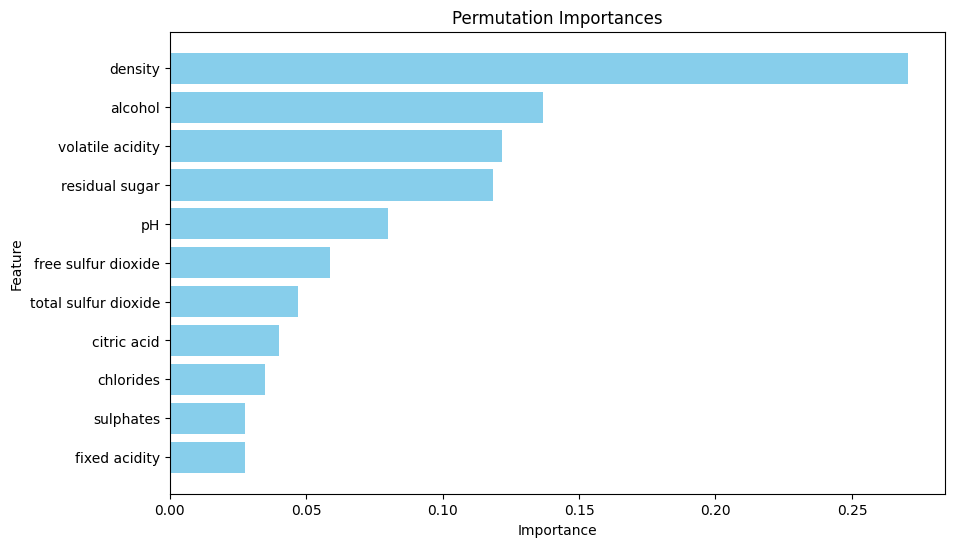

In [100]:
from sklearn.inspection import permutation_importance
# Calculate permutation importances
perm_importance = permutation_importance(final_svr_model, x_test_scaled2, y_test2, n_repeats=30, random_state=42)

# Get feature names
feature_names = X.columns

# Plot permutation importances
sorted_idx = perm_importance.importances_mean.argsort()
plt.figure(figsize=(10, 6))
plt.barh(feature_names[sorted_idx], perm_importance.importances_mean[sorted_idx], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Permutation Importances')
plt.show()

We can thus see that **density** is the most important feature for this model.

For red wine, Alcohol is the most important variable for both the models. But other than that, importance of variables is different for both models, i.e., variables which are important for RF are not necessarily important for SVR. 

However for white wine, Alcohol is most important for RF model but density becomes most important for SVR model.

In [101]:
results = pd.DataFrame({
    'Model': ['Random Forest','SVR With RBF Kernel'],
    'Score': [test_r_squared_rf, test_r_squared_svr]})

result_df = results.sort_values(by='Score', ascending=False)
result_df = result_df.set_index('Score')
result_df

,Model
Score,
0.50130,Random Forest
0.38537,SVR With RBF Kernel


For both Red and white wine, RF model has greater score than SVR model and thus we will use RF model in both cases to predict the quality.

### Testing of Red wine with White wine model

In [102]:
# Test the RF model on the test data
y_test_pred_red = final_rf_model2.predict(x_test_scaled)

# Calculate test R-squared
test_r_squared_rf_red = r2_score(y_test, y_test_pred_red)
print(f"Test R-squared for Red: {test_r_squared_rf_red}")

Test R-squared for Red: 0.15544161245215327


### Testing of White wine with Red wine model

In [103]:
# Test the RF model on the test data
y_test_pred_white = final_rf_model.predict(x_test_scaled2)

# Calculate test R-squared
test_r_squared_rf_white = r2_score(y_test2, y_test_pred_white)
print(f"Test R-squared for White: {test_r_squared_rf_white}")

Test R-squared for White: -0.015610797341468752


We can see that on testing Red wine with model for White and vice versa, we get very very poor score (0.16) and (-0.02) respectively. Thus, we can conclude that the model for red wines is not applicable to white wines and vice versa.

# 2. Classification:

In [104]:
# Import the data
file_path = "Data_Cortex_Nuclear.xls" 
df = pd.read_excel(file_path)

# Display the first few rows of the DataFrame
df.head()

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


## Pre-Processing the data and Visualization

In [105]:
# Print variables which have NaN values
df.columns[df.isna().any()].tolist()
# code from https://stackoverflow.com/questions/36226083/how-to-find-which-columns-contain-any-nan-value-in-pandas-dataframe

['DYRK1A_N',
 'ITSN1_N',
 'BDNF_N',
 'NR1_N',
 'NR2A_N',
 'pAKT_N',
 'pBRAF_N',
 'pCAMKII_N',
 'pCREB_N',
 'pELK_N',
 'pERK_N',
 'pJNK_N',
 'PKCA_N',
 'pMEK_N',
 'pNR1_N',
 'pNR2A_N',
 'pNR2B_N',
 'pPKCAB_N',
 'pRSK_N',
 'AKT_N',
 'BRAF_N',
 'CAMKII_N',
 'CREB_N',
 'ELK_N',
 'ERK_N',
 'GSK3B_N',
 'JNK_N',
 'MEK_N',
 'TRKA_N',
 'RSK_N',
 'APP_N',
 'Bcatenin_N',
 'SOD1_N',
 'MTOR_N',
 'P38_N',
 'pMTOR_N',
 'DSCR1_N',
 'AMPKA_N',
 'NR2B_N',
 'pNUMB_N',
 'RAPTOR_N',
 'TIAM1_N',
 'pP70S6_N',
 'BAD_N',
 'BCL2_N',
 'pCFOS_N',
 'H3AcK18_N',
 'EGR1_N',
 'H3MeK4_N']

In [106]:
list_with_NaN = df.columns[df.isna().any()].tolist()
nan_counts= df[list_with_NaN].isna().sum()
# outputs the number of NaN values in each of the columns with NaN values
# code inspired by https://stackoverflow.com/questions/26266362/how-do-i-count-the-nan-values-in-a-column-in-pandas-dataframe

So, now we will remove those variables first which contains higher than some threshold number of NaN values.

In [107]:
# Filter out columns that exceed the threshold
columns_to_drop = nan_counts[nan_counts > 75].index

# Dropping higher nulls variables
df= df.drop(columns= columns_to_drop) # This function removes rows from the DataFrame where the number of non-null values is less than 75. 

# This code is taken from Internet

In [108]:
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1080 entries, 0 to 1079
Data columns (total 77 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   MouseID          1080 non-null   object 
 1   DYRK1A_N         1077 non-null   float64
 2   ITSN1_N          1077 non-null   float64
 3   BDNF_N           1077 non-null   float64
 4   NR1_N            1077 non-null   float64
 5   NR2A_N           1077 non-null   float64
 6   pAKT_N           1077 non-null   float64
 7   pBRAF_N          1077 non-null   float64
 8   pCAMKII_N        1077 non-null   float64
 9   pCREB_N          1077 non-null   float64
 10  pELK_N           1077 non-null   float64
 11  pERK_N           1077 non-null   float64
 12  pJNK_N           1077 non-null   float64
 13  PKCA_N           1077 non-null   float64
 14  pMEK_N           1077 non-null   float64
 15  pNR1_N           1077 non-null   float64
 16  pNR2A_N          1077 non-null   float64
 17  pNR2B_N       

None

We have droped the variables with NaN values greater than 75 (~10% of the total number of mice, i.e., 762). These variables are unusable as given as they contain too many NaN values.

In [109]:
# create dataframe consisting only of numerical values (including NaN)
df_num_only = df.drop(['MouseID', 'Genotype', 'Treatment', 'Behavior', 'class'], axis=1)
df_num_only

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,pCASP9_N,PSD95_N,SNCA_N,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,pS6_N,pCFOS_N,SYP_N,CaNA_N
0,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,...,1.603310,2.014875,0.108234,1.044979,0.831557,0.188852,0.106305,0.108336,0.427099,1.675652
1,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,...,1.671738,2.004605,0.109749,1.009883,0.849270,0.200404,0.106592,0.104315,0.441581,1.743610
2,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,...,1.663550,2.016831,0.108196,0.996848,0.846709,0.193685,0.108303,0.106219,0.435777,1.926427
3,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,...,1.484624,1.957233,0.119883,0.990225,0.833277,0.192112,0.103184,0.111262,0.391691,1.700563
4,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,...,1.534835,2.009109,0.119524,0.997775,0.878668,0.205604,0.104784,0.110694,0.434154,1.839730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,0.254860,0.463591,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,1.057971,...,1.323554,2.578046,0.167181,1.261651,0.962942,0.275547,0.115806,0.183324,0.374088,1.364823
1076,0.272198,0.474163,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,1.081150,...,1.275605,2.534347,0.169592,1.254872,0.983690,0.283207,0.113614,0.175674,0.375259,1.364478
1077,0.228700,0.395179,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,0.884342,...,1.437534,2.544515,0.179692,1.242248,0.976609,0.290843,0.118948,0.158296,0.422121,1.430825
1078,0.221242,0.412894,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,0.922595,...,1.498820,2.609769,0.185037,1.301071,0.989286,0.306701,0.125295,0.196296,0.397676,1.404031


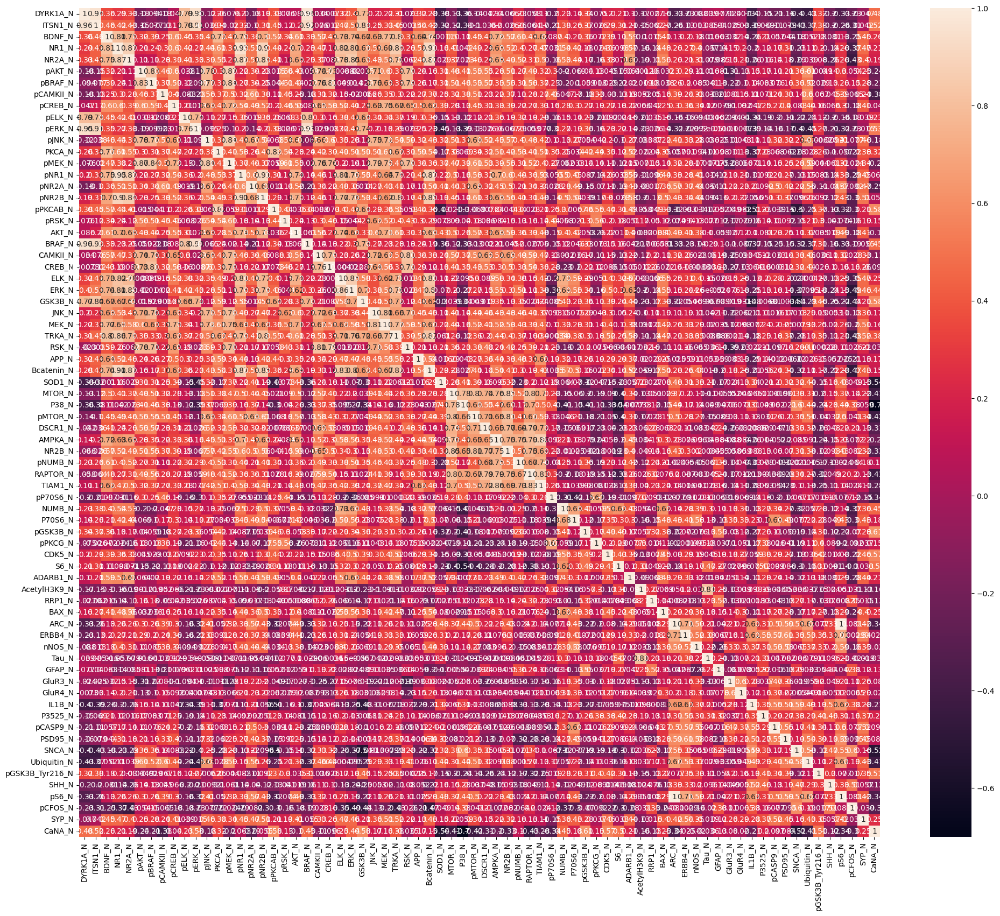

In [110]:
# Check Correlation using HeatMap 
fig, az =plt.subplots(figsize=(24,20))
sns.heatmap(df_num_only.corr(),annot=True)
plt.show()

We can see that while most of the columns don't have much correlation, some of them have very high correlation values of around 0.85-0.95. We would like to remove the high correlation variables since they don't improve the dataset.

In [111]:
# Create correlation matrix
corr_matrix = df_num_only.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

# Drop features
df_num_only.drop(to_drop, axis=1, inplace=True)
df_num_only

# code from https://stackoverflow.com/a/52509954, with only necessary naming and value changes

,DYRK1A_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,pJNK_N,...,P3525_N,pCASP9_N,PSD95_N,SNCA_N,Ubiquitin_N,pGSK3B_Tyr216_N,SHH_N,pCFOS_N,SYP_N,CaNA_N
0,0.503644,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,1.750936,0.306382,...,0.247538,1.603310,2.014875,0.108234,1.044979,0.831557,0.188852,0.108336,0.427099,1.675652
1,0.514617,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,1.596377,0.299051,...,0.257632,1.671738,2.004605,0.109749,1.009883,0.849270,0.200404,0.104315,0.441581,1.743610
2,0.509183,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,1.561316,0.291276,...,0.255343,1.663550,2.016831,0.108196,0.996848,0.846709,0.193685,0.106219,0.435777,1.926427
3,0.442107,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,1.595086,0.296729,...,0.251103,1.484624,1.957233,0.119883,0.990225,0.833277,0.192112,0.111262,0.391691,1.700563
4,0.434940,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,1.504230,0.286961,...,0.251773,1.534835,2.009109,0.119524,0.997775,0.878668,0.205604,0.110694,0.434154,1.839730
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1075,0.254860,0.254860,2.092082,2.600035,0.211736,0.171262,2.483740,0.207317,1.057971,0.294097,...,0.326362,1.323554,2.578046,0.167181,1.261651,0.962942,0.275547,0.183324,0.374088,1.364823
1076,0.272198,0.251638,2.161390,2.801492,0.251274,0.182496,2.512737,0.216339,1.081150,0.285116,...,0.344160,1.275605,2.534347,0.169592,1.254872,0.983690,0.283207,0.175674,0.375259,1.364478
1077,0.228700,0.234118,1.733184,2.220852,0.220665,0.161435,1.989723,0.185164,0.884342,0.245703,...,0.358114,1.437534,2.544515,0.179692,1.242248,0.976609,0.290843,0.158296,0.422121,1.430825
1078,0.221242,0.243974,1.876347,2.384088,0.208897,0.173623,2.086028,0.192044,0.922595,0.263179,...,0.352279,1.498820,2.609769,0.185037,1.301071,0.989286,0.306701,0.196296,0.397676,1.404031


In [112]:
# display number of NaN values in each variable in df_num_only
df_num_only.isna().sum()

DYRK1A_N            3
BDNF_N              3
NR1_N               3
NR2A_N              3
pAKT_N              3
                   ..
pGSK3B_Tyr216_N     0
SHH_N               0
pCFOS_N            75
SYP_N               0
CaNA_N              0
Length: 65, dtype: int64

We have a few variables with missing values. We can impute the missing values by using multivariate imputation from sklearn.

In [113]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Multivariate feature imputation from sklearn to impute missing data
imp = IterativeImputer(max_iter=100, random_state=0)
df_num_imp = imp.fit_transform(df_num_only)

# convert the df_num_imp array to Pandas DataFrame
df_num_imp = pd.DataFrame(df_num_imp, columns = df_num_only.columns.tolist())

In [115]:
# display number of NaN values in each variable in df_num_imp
df_num_imp.isna().sum()

DYRK1A_N           0
BDNF_N             0
NR1_N              0
NR2A_N             0
pAKT_N             0
                  ..
pGSK3B_Tyr216_N    0
SHH_N              0
pCFOS_N            0
SYP_N              0
CaNA_N             0
Length: 65, dtype: int64

Successfully imputed missing data. Now we need to normalize this data by using sklearn's StandardScaler.

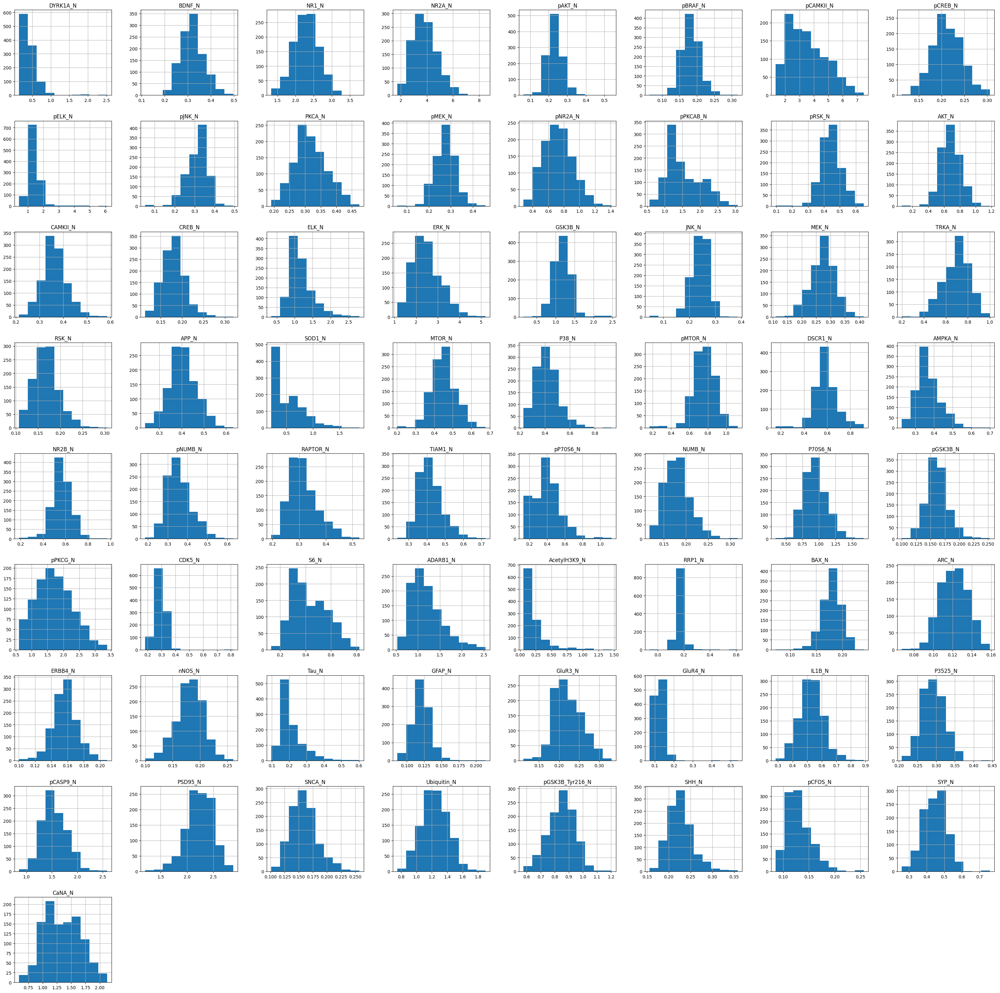

In [116]:
# Plot Histogram
df_num_imp.hist(bins=10, figsize=(40,40))
plt.show()

### Splitting the data into Training, Validation and Test

In [130]:
# Splitting Target Value(Quality) and Features X--> Input features to Model Y--> Wine Quality Score
X=df_num_imp
Y=df['Genotype']
Y = Y.replace({"Control": 0, "Ts65Dn": 1})

# Define output for multi-class classification
Z= df['class'] 

In [131]:
# Splitting dataset into 60-20-20 ratio
from sklearn.model_selection import train_test_split
x, x_test, y, y_test = train_test_split(X,Y,test_size=0.2,train_size=0.8)
x_train, x_val, y_train, y_val = train_test_split(x,y,test_size = 0.25,train_size =0.75)

In [132]:
# Scale the features to have zero mean and unit variance
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_val_scaled = scaler.transform(x_val)
x_test_scaled = scaler.transform(x_test)

### **RandomForest**

In [133]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from tabulate import tabulate

# Hyperparameters which will be varied discretely
max_depth_values = np.linspace(2,30,5)
n_estimators_values = [50,100,200,300,400]

# Initialize variables 
results = []

# Loop over each combination of hyperparameters
for max_depth in max_depth_values:
    for n_estimators in n_estimators_values:
        # Initialize the Random Forest model with current hyperparameters
        rf_model = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, random_state=10)

        # Train the model on the training data
        rf_model.fit(x_train_scaled, y_train)

        # Validate the model on the validation data
        y_val_pred = rf_model.predict(x_val_scaled)

        # Calculate F1-score
        f1_scr = f1_score(y_val, y_val_pred)

        # Store results
        results.append([f1_scr, max_depth, n_estimators])

# Print the results as a table
print(tabulate(results, headers=['F1-SCORE', 'Max Depth', 'N Estimators'], tablefmt='pretty'))

+--------------------+-----------+--------------+
|      F1-SCORE      | Max Depth | N Estimators |
+--------------------+-----------+--------------+
| 0.8704663212435233 |    2.0    |      50      |
| 0.8497409326424871 |    2.0    |     100      |
| 0.8210526315789475 |    2.0    |     200      |
| 0.8148148148148149 |    2.0    |     300      |
| 0.8210526315789475 |    2.0    |     400      |
| 0.9600000000000001 |    9.0    |      50      |
| 0.9651741293532339 |    9.0    |     100      |
| 0.9803921568627451 |    9.0    |     200      |
| 0.9753694581280787 |    9.0    |     300      |
| 0.9753694581280787 |    9.0    |     400      |
| 0.9600000000000001 |   16.0    |      50      |
| 0.9753694581280787 |   16.0    |     100      |
| 0.9853658536585366 |   16.0    |     200      |
| 0.9753694581280787 |   16.0    |     300      |
| 0.9753694581280787 |   16.0    |     400      |
| 0.9600000000000001 |   23.0    |      50      |
| 0.9753694581280787 |   23.0    |     100      |


In [134]:
# Finding the hyperparamters which give best model (higher F1 score => Better model)
best_f1score = -float('inf')
best_max_depth = None
best_n_estimators = None

# Loop through the results to find the best F1-score and its corresponding hyperparameters
for f1_scr, max_depth, n_estimators in results:
    if f1_scr > best_f1score:
        best_f1score = f1_scr
        best_max_depth = max_depth
        best_n_estimators = n_estimators
        
# Train the final model with the best hyperparameters on the entire training set
final_rf_model = RandomForestClassifier(n_estimators=best_n_estimators, max_depth=best_max_depth, random_state=42)
final_rf_model.fit(x_train_scaled, y_train)

# Test the final model on the test data
y_test_pred = final_rf_model.predict(x_test_scaled)

# Calculate test f1-score
test_f1_rf = f1_score(y_test, y_test_pred)
print(f"Test F1-SCORE: {test_f1_rf}")

Test F1-SCORE: 0.985781990521327


In [135]:
# Print the classification report
print(metrics.classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.99       109
           1       1.00      0.97      0.99       107

    accuracy                           0.99       216
   macro avg       0.99      0.99      0.99       216
weighted avg       0.99      0.99      0.99       216



### **Support vector classification using RBF kernel**

In [136]:
from sklearn.svm import SVC

# Range of hyperparameters to try
param_C= [0.01,0.1, 1, 10, 100]  # Varying the C parameter
param_gamma= ['scale', 'auto'] # Varying gamma parameter

# Initialize variables 
results = []

# Iterate over each combination of hyperparameters
for C in param_C:
    for gamma in param_gamma:
        # Train the SVC model with RBF kernel
        svc_model = SVC(kernel='rbf', C=C, gamma=gamma)
        svc_model.fit(x_train_scaled, y_train)
        
        # Validate the SVC model on the validation data
        y_val_pred = svc_model.predict(x_val_scaled)
        
        # Calculate F1-score
        f1_scr = f1_score(y_val, y_val_pred)

        # Store results
        results.append([f1_scr, C, gamma])

# Print the results as a table
print(tabulate(results, headers=['F1-SCORE', 'C', 'GAMMA'], tablefmt='pretty'))

+--------------------+------+-------+
|      F1-SCORE      |  C   | GAMMA |
+--------------------+------+-------+
|        0.0         | 0.01 | scale |
|        0.0         | 0.01 | auto  |
| 0.8268156424581006 | 0.1  | scale |
| 0.8268156424581006 | 0.1  | auto  |
| 0.9902912621359222 |  1   | scale |
| 0.9902912621359222 |  1   | auto  |
|        1.0         |  10  | scale |
|        1.0         |  10  | auto  |
|        1.0         | 100  | scale |
|        1.0         | 100  | auto  |
+--------------------+------+-------+


In [137]:
# Finding the hyperparamters which give best model (higher F1 score => Better model)
best_f1_score = -float('inf')
best_C2 = None
best_gamma2 = None

# Loop through the results to find the best R-squared and its corresponding hyperparameters
for f1_scr, C, gamma in results:
    if f1_scr > best_f1_score:
        best_f1_score = f1_scr
        best_C2 = C
        best_gamma2 = gamma

# Train the final model with the best hyperparameters on the entire training set
final_svc_model = SVC(kernel='rbf', C=best_C2, gamma=best_gamma2)
final_svc_model.fit(x_train_scaled, y_train)

# Test the final model on the test data
y_test_pred = final_svc_model.predict(x_test_scaled)

# Calculate test f1-score
test_f1_svc = f1_score(y_test, y_test_pred)
print(f"Test F1-SCORE: {test_f1_svc}")

Test F1-SCORE: 1.0


In [138]:
# Print the classification report
print(metrics.classification_report(y_test,y_test_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       109
           1       1.00      1.00      1.00       107

    accuracy                           1.00       216
   macro avg       1.00      1.00      1.00       216
weighted avg       1.00      1.00      1.00       216



## RECURSIVE FEATURE ELIMINATION

We have to perform RFE on multi-class classification as for binary, it won't give any difference.

### **RandomForest**

In [126]:
# Split data into train and test for 8-class classification
from sklearn.model_selection import train_test_split
x_train, x_test, z_train, z_test = train_test_split(X,Z,test_size=0.2,train_size=0.8)

# Scale the training set to zero mean and unit variance
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Initially perform normal RandomForest with no feature elimination. Find best hyperparameters using grid-search
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Tuning hyperparameters by doing grid search. Selection criteria- f1-score
hyperparameters = {'max_depth': [2,5,10,20],'n_estimators':[50,100,200,300]}

# Create a Random Forest Classifier
rf_classifier = RandomForestClassifier()

# Create the grid search object
grid_search = GridSearchCV(estimator=rf_classifier, param_grid=hyperparameters, scoring='f1_macro')

# Fit the grid search to the training data
grid_search.fit(x_train_scaled, z_train)

# Get the best model
best_rf_model = grid_search.best_estimator_

# Predict on the test data using the best model
z_pred = best_rf_model.predict(x_test_scaled)

# Print f1-score
report = metrics.classification_report(z_test, z_pred)
print(report)

              precision    recall  f1-score   support

      c-CS-m       0.97      1.00      0.99        36
      c-CS-s       1.00      0.97      0.98        30
      c-SC-m       1.00      1.00      1.00        30
      c-SC-s       1.00      1.00      1.00        33
      t-CS-m       1.00      1.00      1.00        26
      t-CS-s       1.00      1.00      1.00        18
      t-SC-m       1.00      1.00      1.00        19
      t-SC-s       1.00      1.00      1.00        24

    accuracy                           1.00       216
   macro avg       1.00      1.00      1.00       216
weighted avg       1.00      1.00      1.00       216



In [127]:
# Perform recursive feature elimination using RFECV from scikit-learn
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier

# Select minimum number of features needed in final model
features_selected=20

# Train the reudced model
rfe_selector = RFECV(estimator=best_rf_model, min_features_to_select=features_selected, step=1)
rfe_selector.fit(x_train_scaled,z_train)

# Predict on the test data using the best model and selected features
z_pred_rfe = rfe_selector.predict(x_test_scaled)

# Generate the classification report
report = metrics.classification_report(z_test, z_pred_rfe)

# Print number of features in final model
print(f"Optimal number of features: {rfe_selector.n_features_}")
# Print the classification report
print(report)

Optimal number of features: 47
              precision    recall  f1-score   support

      c-CS-m       0.95      1.00      0.97        36
      c-CS-s       1.00      0.93      0.97        30
      c-SC-m       1.00      1.00      1.00        30
      c-SC-s       1.00      0.97      0.98        33
      t-CS-m       1.00      1.00      1.00        26
      t-CS-s       1.00      1.00      1.00        18
      t-SC-m       1.00      1.00      1.00        19
      t-SC-s       0.96      1.00      0.98        24

    accuracy                           0.99       216
   macro avg       0.99      0.99      0.99       216
weighted avg       0.99      0.99      0.99       216



By doing Recursive Feature Elimination, we got the best model for Random Forest with 39 features. However, by comparing present and earlier(without elimination) classification report, we can see that performance of the model improved, present f1-score is 1 which is higher than its without rfe score(0.97) and hence model's classifying power has increased. with reducing features.

### **Support vector classification using RBF kernel**

We cannot use RFECV function directly as kernel is non-linear. So, we will instead do feature elimination manually, i.e., first we will sort the features according to their importance and then will keep removing the least important feature till we get best accuracy.

In [128]:
# Split data into train and test for 8-class classification
from sklearn.model_selection import train_test_split
x_train, x_test, z_train, z_test = train_test_split(X,Z,test_size=0.2,train_size=0.8)

# Scale the training set to zero mean and unit variance
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Tuning hyperparameters by doing grid search. Selection criteria- f1-score
hyperparameters = {'C': [0.01,0.1, 1, 10, 100],'gamma':['scale', 'auto']}

# Create a SVC Classifier
svc_classifier = SVC()

# Create the grid search object
grid_search = GridSearchCV(estimator=svc_classifier, param_grid=hyperparameters, scoring='f1_macro')

# Fit the grid search to the training data
grid_search.fit(x_train_scaled, z_train)

# Get the best model
best_svc_model = grid_search.best_estimator_

# Predict on the test data using the best model
z_pred = best_svc_model.predict(x_test_scaled)

# Print f1-score
report = metrics.classification_report(z_test, z_pred)
print(report)

              precision    recall  f1-score   support

      c-CS-m       1.00      1.00      1.00        30
      c-CS-s       1.00      1.00      1.00        34
      c-SC-m       1.00      1.00      1.00        30
      c-SC-s       1.00      1.00      1.00        27
      t-CS-m       1.00      1.00      1.00        21
      t-CS-s       1.00      1.00      1.00        23
      t-SC-m       1.00      1.00      1.00        22
      t-SC-s       1.00      1.00      1.00        29

    accuracy                           1.00       216
   macro avg       1.00      1.00      1.00       216
weighted avg       1.00      1.00      1.00       216



In [129]:
# Initial accuracy
best_accuracy = metrics.accuracy_score(z_test, z_pred)
best_features = list(range(X.shape[1]))

# Iterate to remove features one by one
while len(best_features) > 1:
    # Calculate permutation importance
    perm_importance = permutation_importance(best_svc_model, x_test_scaled, z_test, n_repeats=10, random_state=42)
    feature_importances = perm_importance.importances_mean
    
    # Find the least important feature
    least_important_index = np.argmin(feature_importances)

   # Remove the least important feature
    removed_feature = best_features.pop(least_important_index)
    X_train_temp = np.delete(x_train_scaled, removed_feature, axis=1)
    X_test_temp = np.delete(x_test_scaled, removed_feature, axis=1)

    # Retrain the model without the removed feature
    best_svc_model.fit(X_train_temp, z_train)
    
    # Evaluate the model
    z_pred_fe = best_svc_model.predict(X_test_temp)
    accuracy = metrics.accuracy_score(z_test, z_pred_fe)

    # Check if the accuracy improved
    if accuracy > best_accuracy:
        best_accuracy = accuracy
    else:
        # Re-add the removed feature if the accuracy did not improve
        best_features.insert(least_important_index, removed_feature)
        break
print(f"Optimal number of features: {best_svc_model.n_features_in_}")
print(metrics.classification_report(z_test,z_pred_fe))

Optimal number of features: 64
              precision    recall  f1-score   support

      c-CS-m       1.00      1.00      1.00        30
      c-CS-s       1.00      1.00      1.00        34
      c-SC-m       1.00      1.00      1.00        30
      c-SC-s       1.00      1.00      1.00        27
      t-CS-m       1.00      1.00      1.00        21
      t-CS-s       1.00      1.00      1.00        23
      t-SC-m       1.00      1.00      1.00        22
      t-SC-s       1.00      1.00      1.00        29

    accuracy                           1.00       216
   macro avg       1.00      1.00      1.00       216
weighted avg       1.00      1.00      1.00       216



# 3.Practice using pre-trained neural networks to extract domain-specific features for new tasks.

## Implementing the PyTorch tutorial https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html as is and checking its working, except for Fine Tuning ConvNet section.

In [141]:
# License: BSD
# Author: Sasank Chilamkurthy

from __future__ import print_function, division

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import torchvision
from torchvision import datasets, models, transforms
import time
import os
import copy
from tempfile import TemporaryDirectory

cudnn.benchmark = True
plt.ion()   # interactive mode

#### Load Data

In [142]:
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = 'hymenoptera_data'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4,
                                             shuffle=True, num_workers=2)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#### Visualize a few images

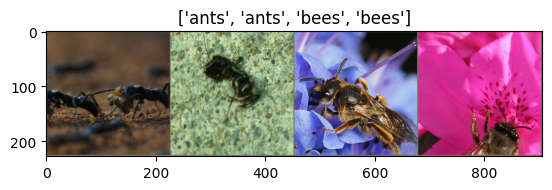

In [143]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title=[class_names[x] for x in classes])

#### Training the model

In [144]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25):
    since = time.time()

    # Create a temporary directory to save training checkpoints
    with TemporaryDirectory() as tempdir:
        best_model_params_path = os.path.join(tempdir, 'best_model_params.pt')

        torch.save(model.state_dict(), best_model_params_path)
        best_acc = 0.0

        for epoch in range(num_epochs):
            print(f'Epoch {epoch}/{num_epochs - 1}')
            print('-' * 10)

            # Each epoch has a training and validation phase
            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()  # Set model to training mode
                else:
                    model.eval()   # Set model to evaluate mode

                running_loss = 0.0
                running_corrects = 0

                # Iterate over data.
                for inputs, labels in dataloaders[phase]:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    # zero the parameter gradients
                    optimizer.zero_grad()

                    # forward
                    # track history if only in train
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)

                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)
                if phase == 'train':
                    scheduler.step()

                epoch_loss = running_loss / dataset_sizes[phase]
                epoch_acc = running_corrects.double() / dataset_sizes[phase]

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

                # deep copy the model
                if phase == 'val' and epoch_acc > best_acc:
                    best_acc = epoch_acc
                    torch.save(model.state_dict(), best_model_params_path)

            print()

        time_elapsed = time.time() - since
        print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
        print(f'Best val Acc: {best_acc:4f}')

        # load best model weights
        model.load_state_dict(torch.load(best_model_params_path))
    return model

#### Visualizing the model predictions

In [145]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

#### ConvNet as fixed feature extractor

In [146]:
model_conv = torchvision.models.resnet18(weights='IMAGENET1K_V1')
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, 2)

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

#### Train and Evaluate

In [147]:
model_conv = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs=25)

Epoch 0/24
----------
train Loss: 0.6660 Acc: 0.6557
val Loss: 0.3639 Acc: 0.8497

Epoch 1/24
----------
train Loss: 0.6161 Acc: 0.7418
val Loss: 0.2084 Acc: 0.9346

Epoch 2/24
----------
train Loss: 0.7655 Acc: 0.7131
val Loss: 0.2529 Acc: 0.9150

Epoch 3/24
----------
train Loss: 0.3314 Acc: 0.8607
val Loss: 0.2397 Acc: 0.9150

Epoch 4/24
----------
train Loss: 0.4636 Acc: 0.7910
val Loss: 0.2052 Acc: 0.9346

Epoch 5/24
----------
train Loss: 0.4767 Acc: 0.8033
val Loss: 0.2050 Acc: 0.9216

Epoch 6/24
----------
train Loss: 0.4744 Acc: 0.7910
val Loss: 0.2128 Acc: 0.9346

Epoch 7/24
----------
train Loss: 0.3168 Acc: 0.8443
val Loss: 0.1745 Acc: 0.9477

Epoch 8/24
----------
train Loss: 0.2822 Acc: 0.8770
val Loss: 0.2151 Acc: 0.9346

Epoch 9/24
----------
train Loss: 0.3670 Acc: 0.8566
val Loss: 0.1851 Acc: 0.9477

Epoch 10/24
----------
train Loss: 0.3844 Acc: 0.8279
val Loss: 0.2172 Acc: 0.9412

Epoch 11/24
----------
train Loss: 0.3831 Acc: 0.8361
val Loss: 0.1903 Acc: 0.9477

Ep

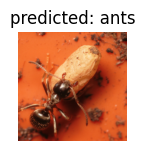

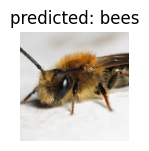

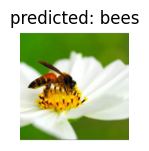

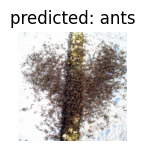

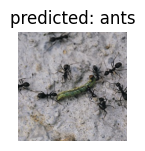

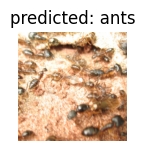

In [148]:
visualize_model(model_conv)

plt.ioff()
plt.show()

## Function that outputs ResNet18 features for a given input image. Extract features for training images 

In [149]:
def get_features(image_data):
      
      # define resnet18 model
      model_conv_feat = torchvision.models.resnet18(pretrained=True)

      # disable gradient requirement of the params in the model
      for param in model_conv_feat.parameters():
            param.requires_grad = False

      # define the last layer to be Identity
      # this will ensure that the output is basically the input to the last layer
      # i.e., the features obtained
      model_conv_feat.fc = nn.Identity()
      model_conv_feat = model_conv_feat.to(device) 

      # define columns for the feature matrix dataframe     
      df_columns = [x for x in range(512)].copy()
      df_columns.append('label')

      # empty image_features list
      image_features = []

      # use DataLoader to get the model interpretable image data
      dataloader = {'data': torch.utils.data.DataLoader(image_data)}
      
      for inputs, labels in dataloader['data']:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # get output of the model
            outputs = model_conv_feat(inputs)

            # .cpu() needs to be done in order to convert the output to a list
            outputs_cpu = outputs.cpu()

            # [0] indexing is done because outputs_cpu.tolist() and labels.tolist()
            # returns a list of list, we only need that inner list
            outputs_cpu = outputs_cpu.tolist()[0].copy()
            labels = labels.tolist()[0]
            outputs_cpu.append(labels)

            # append the output to image_features list
            image_features.append(outputs_cpu)

      # convert the image_features list to a pandas dataframe
      image_features = pd.DataFrame(image_features, columns = df_columns)
      
      # return the image_features dataframe
      return image_features

In [150]:
# get training and validation features
features_train = get_features(image_datasets['train'])
features_val = get_features(image_datasets['val'])

# drop the label column in both training and validation datasets and define output y for both datasets as the same column
X_train = features_train.drop(['label'], axis=1)
y_train = features_train['label']

X_val = features_val.drop(['label'], axis=1)
y_val = features_val['label']

# print the dimensions of features for training images and validation images
print(f"Training images: {X_train.shape}")
print(f"Validation images: {X_val.shape}")

C:\Users\HP\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.7_qbz5n2kfra8p0\LocalCache\local-packages\Python37\site-packages\torchvision\models\_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and may be removed in the future, "
C:\Users\HP\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.7_qbz5n2kfra8p0\LocalCache\local-packages\Python37\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Training images: (244, 512)
Validation images: (153, 512)


Hence we can see that features for training images is a Nx512 dimensional array with =244.

### **SVM with RBF Kernel**

In [151]:
# Scale the training set to zero mean and unit variance
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(X_train)
x_test_scaled = scaler.transform(X_val)

from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Tuning hyperparameters by doing grid search. Selection criteria- f1-score
hyperparameters = {'C': [0.01,0.1, 1, 10, 100],'gamma':['scale', 'auto']}

# Create a SVC Classifier
svc_classifier = SVC()

# Create the grid search object
grid_search = GridSearchCV(estimator=svc_classifier, param_grid=hyperparameters, scoring='f1_macro')

# Fit the grid search to the training data
grid_search.fit(x_train_scaled, y_train)

# Get the best model
best_svc_model = grid_search.best_estimator_

# Predict on the test data using the best model
y_pred = best_svc_model.predict(x_test_scaled)

# Print score metric
print(f"Accuracy :{metrics.accuracy_score(y_val, y_pred)}")
print(f"F1 score :{metrics.f1_score(y_val, y_pred)}")

Accuracy :0.5816993464052288
F1 score :0.6049382716049382


### **RandomForest**

In [152]:
# Scale the training set to zero mean and unit variance
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(X_train)
x_test_scaled = scaler.transform(X_val)

# Initially perform normal RandomForest with no feature elimination. Find best hyperparameters using grid-search
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Tuning hyperparameters by doing grid search. Selection criteria- f1-score
hyperparameters = {'max_depth': [2,5,10,20],'n_estimators':[50,100,200,300]}

# Create a Random Forest Classifier
rf_classifier = RandomForestClassifier()

# Create the grid search object
grid_search = GridSearchCV(estimator=rf_classifier, param_grid=hyperparameters, scoring='f1')

# Fit the grid search to the training data
grid_search.fit(x_train_scaled, y_train)

# Get the best model
best_rf_model = grid_search.best_estimator_

# Predict on the test data using the best model
y_pred = best_rf_model.predict(x_test_scaled)

# Print score metric
print(f"Accuracy :{metrics.accuracy_score(y_val, y_pred)}")
print(f"F1 score :{metrics.f1_score(y_val, y_pred)}")

Accuracy :0.5555555555555556
F1 score :0.5526315789473684


We can see that both F1 score and accuray is better for SVC model in comparison to RandomForest model. So, SVC model has better performance and thus is better model.